# Center Crop Images

In [32]:
from PIL import Image

def center_crop_images_to_smallest(image_paths):
    """Load images and center-crop each to the smallest (width, height) among them."""
    images = [Image.open(path).convert("RGB") for path in image_paths]

    # Get the smallest width and height among all images
    min_width = min(img.width for img in images)
    min_height = min(img.height for img in images)

    cropped_images = []

    for img in images:
        left = (img.width - min_width) // 2
        top = (img.height - min_height) // 2
        right = left + min_width
        bottom = top + min_height
        cropped = img.crop((left, top, right, bottom))
        cropped_images.append(cropped)

    return cropped_images


In [98]:
image_paths = ["CartoonBoy1.png", "CartoonBoy2.png", "CartoonBoy3.png", "CartoonBoy4.png"]
cropped_images = center_crop_images_to_smallest(image_paths)

# Optional: save cropped images
for i, img in enumerate(cropped_images):
    img.save(f"CartoonBoyCropped_{i+1}.png")


# SSIM Comparison

In [80]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.filters import threshold_otsu

def calculate_ssim(image1, image2):
    """Calculate SSIM and SSIM difference map between two images."""
    image1 = img_as_float(image1)
    image2 = img_as_float(image2)
    h, w = image1.shape[:2]
    win_size = min(h, w)
    if win_size % 2 == 0:
        win_size -= 1
    win_size = max(win_size, 3)  # Ensure win_size is odd and ≥ 3
    score, diff = ssim(
        image1, image2,
        channel_axis=-1,
        win_size=win_size,
        data_range=1.0,
        full=True
    )
    return score, diff

In [81]:
def calculate_ssim_for_images(image_paths):
    """Calculate SSIM and visualize differences for each image pair."""
    for i in range(len(image_paths)):
        for j in range(i + 1, len(image_paths)):
            path1 = image_paths[i]
            path2 = image_paths[j]

            # Load images and convert to RGB
            img1 = Image.open(path1).convert("RGB")
            img2 = Image.open(path2).convert("RGB")

            # Convert to numpy arrays
            img1_np = np.array(img1)
            img2_np = np.array(img2)

            # Calculate SSIM and diff map
            score, diff = calculate_ssim(img1_np, img2_np)

            # Normalize SSIM map for display: diff is in [-1, 1], so normalize to [0,1]
            norm_diff = (diff - diff.min()) / (diff.max() - diff.min())

            # Invert diff so high values mean big difference (changed regions)
            diff_inverted = 1 - norm_diff

            print(f"SSIM score: {score:.4f}")
            print(f"Diff min/max before norm: {diff.min():.4f}, {diff.max():.4f}")
         


            # Threshold the inverted diff to create binary mask
            gray_diff = diff_inverted.mean(axis=2)  # or np.max(axis=2)
            thresh = threshold_otsu(gray_diff)
            binary_mask = (gray_diff > thresh).astype(np.uint8)
            print(f"Otsu threshold: {thresh:.4f}")

            print(f"diff_inverted min: {diff_inverted.min()}, max: {diff_inverted.max()}, mean: {diff_inverted.mean()}")
            print(f"Non-zero pixels count: {(diff_inverted > 0).sum()}")

            print("binary_mask dtype:", binary_mask.dtype)
            print("binary_mask unique values:", np.unique(binary_mask))
            print("binary_mask min/max:", binary_mask.min(), binary_mask.max())
            print("binary_mask sum (nonzero pixels):", binary_mask.sum())
            print("binary_mask shape:", binary_mask.shape)


            # Plot images, SSIM diff map, and binary change mask
            fig, axs = plt.subplots(1, 4, figsize=(16, 4))
            axs[0].imshow(img1)
            axs[0].set_title(f"Image 1\n{os.path.basename(path1)}")
            axs[1].imshow(img2)
            axs[1].set_title(f"Image 2\n{os.path.basename(path2)}")
            axs[2].imshow(norm_diff, cmap='viridis')
            axs[2].set_title(f"SSIM Map\nScore: {score:.4f}")
            axs[3].imshow(binary_mask.astype(np.uint8), cmap='gray',vmin=0, vmax=1)
            axs[3].set_title("Change Mask (Binary)")
            for ax in axs:
                ax.axis("off")
                
            plt.tight_layout()
            plt.show()

SSIM score: 0.0636
Diff min/max before norm: -0.2925, 0.4083
Otsu threshold: 0.5062
diff_inverted min: 0.0, max: 1.0, mean: 0.49392611666027947
Non-zero pixels count: 647279
binary_mask dtype: uint8
binary_mask unique values: [0 1]
binary_mask min/max: 0 1
binary_mask sum (nonzero pixels): 97033
binary_mask shape: (465, 464)


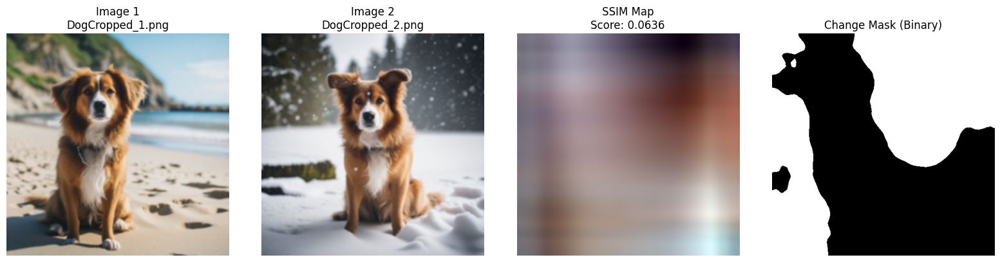

SSIM score: 0.1944
Diff min/max before norm: -0.2754, 0.4169
Otsu threshold: 0.4738
diff_inverted min: 0.0, max: 1.0, mean: 0.3824523428310731
Non-zero pixels count: 647279
binary_mask dtype: uint8
binary_mask unique values: [0 1]
binary_mask min/max: 0 1
binary_mask sum (nonzero pixels): 49864
binary_mask shape: (465, 464)


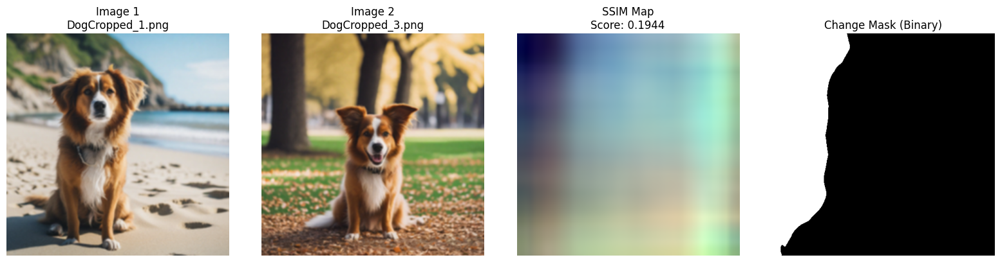

SSIM score: 0.0344
Diff min/max before norm: -0.3065, 0.4465
Otsu threshold: 0.5715
diff_inverted min: 0.0, max: 1.0, mean: 0.5162819694193955
Non-zero pixels count: 647279
binary_mask dtype: uint8
binary_mask unique values: [0 1]
binary_mask min/max: 0 1
binary_mask sum (nonzero pixels): 68812
binary_mask shape: (465, 464)


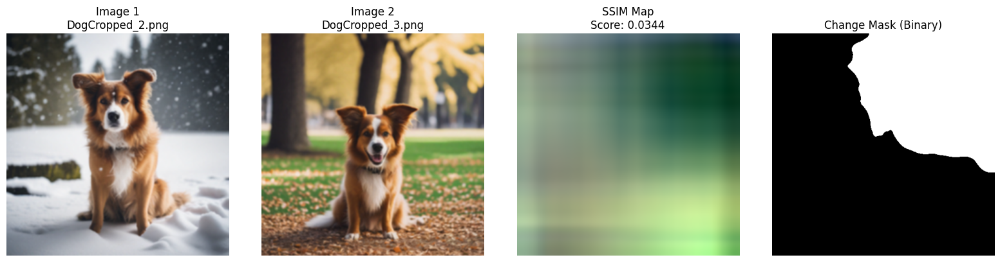

In [82]:
DogImages = ["DogCropped_1.png", "DogCropped_2.png", "DogCropped_3.png"]

# Ensure all images exist
for path in DogImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Compute and visualize SSIM comparisons with change mask
calculate_ssim_for_images(DogImages)


SSIM score: 0.3452
Diff min/max before norm: 0.0874, 0.5691
Otsu threshold: 0.4995
diff_inverted min: 0.0, max: 1.0, mean: 0.47353988630324273
Non-zero pixels count: 647279
binary_mask dtype: uint8
binary_mask unique values: [0 1]
binary_mask min/max: 0 1
binary_mask sum (nonzero pixels): 88553
binary_mask shape: (465, 464)


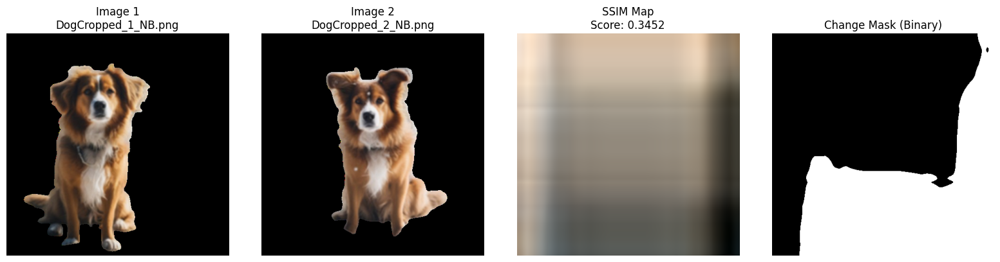

SSIM score: 0.2892
Diff min/max before norm: 0.0802, 0.4584
Otsu threshold: 0.5347
diff_inverted min: 0.0, max: 1.0, mean: 0.5006764129086957
Non-zero pixels count: 647279
binary_mask dtype: uint8
binary_mask unique values: [0 1]
binary_mask min/max: 0 1
binary_mask sum (nonzero pixels): 80611
binary_mask shape: (465, 464)


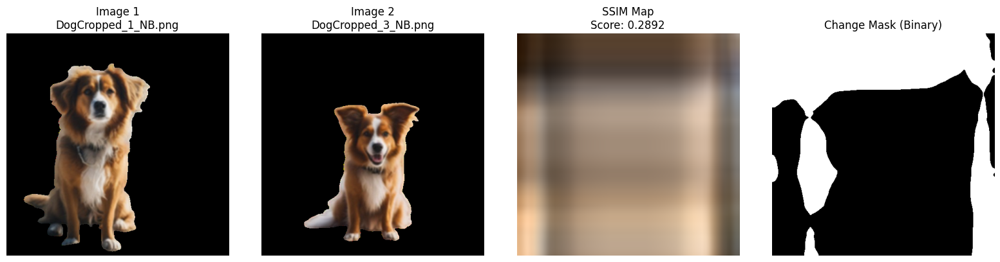

SSIM score: 0.4495
Diff min/max before norm: 0.1380, 0.6587
Otsu threshold: 0.5000
diff_inverted min: 0.0, max: 1.0, mean: 0.45011847850214526
Non-zero pixels count: 647279
binary_mask dtype: uint8
binary_mask unique values: [0 1]
binary_mask min/max: 0 1
binary_mask sum (nonzero pixels): 63496
binary_mask shape: (465, 464)


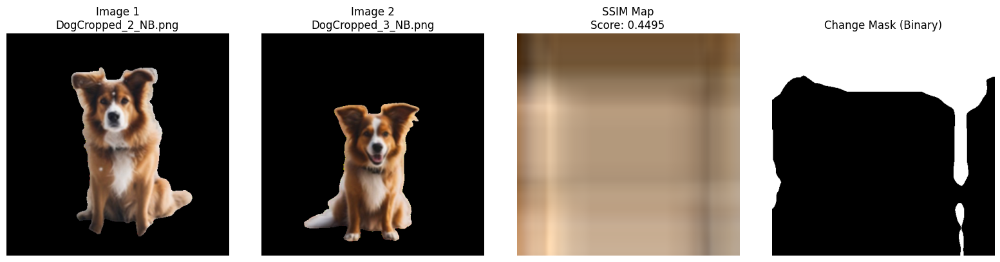

In [83]:
DogImages = ["DogCropped_1_NB.png", "DogCropped_2_NB.png", "DogCropped_3_NB.png"]

# Ensure all images exist
for path in DogImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Compute and visualize SSIM comparisons with change mask
calculate_ssim_for_images(DogImages)


# INCONCLUSIVEEE 

# Color Histogram (L1 Distance)

In [104]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Create color histogram for each image
def calculate_color_histogram(image):
    """Calculate color histogram for an image."""
    hist = np.zeros((256, 3), dtype=int)
    for channel in range(3):  # Assuming RGB
        hist[:, channel], _ = np.histogram(image[:, :, channel], bins=256, range=(0, 255))
    return hist

In [105]:
# Compare two color histograms
def compare_color_histograms(hist1, hist2):
    """Compare two color histograms."""
    return np.sum(np.abs(hist1 - hist2))

In [110]:
def plot_histogram_comparison(hist1, hist2, title1, title2, image_pair_label):
    colors = ['red', 'green', 'blue']
    
    # Normalize histograms to [0, 1] for better comparison
    hist1_norm = hist1 / hist1.max(axis=0)
    hist2_norm = hist2 / hist2.max(axis=0)
    hist_diff = np.abs(hist1_norm - hist2_norm)

    fig, axs = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

    for i in range(3):
        axs[i].plot(hist1_norm[:, i], color=colors[i], label=f"{title1} ({colors[i]})", alpha=0.7)
        axs[i].plot(hist2_norm[:, i], color=colors[i], linestyle='--', label=f"{title2} ({colors[i]})", alpha=0.7)
        axs[i].set_ylabel("Normalized")
        axs[i].legend(loc="upper right")
        axs[i].grid(True, linestyle='--', alpha=0.3)

    # Plot absolute difference
    for i, color in enumerate(colors):
        axs[3].plot(hist_diff[:, i], color=colors[i], label=f"Δ {colors[i]}")
    axs[3].set_ylabel("Abs Diff")
    axs[3].set_xlabel("Pixel Intensity")
    axs[3].legend(loc="upper right")
    axs[3].grid(True, linestyle='--', alpha=0.3)

    plt.suptitle(f"Color Histogram Comparison: {image_pair_label}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [108]:
# Compare color histograms of image pairs and visualize
def compare_color_histograms_for_images(image_paths):
    """Compare color histograms for each pair of images in the given list."""
    histogram_differences = {}
    for i in range(len(image_paths)):
        img1 = io.imread(image_paths[i])
        hist1 = calculate_color_histogram(img1)
        for j in range(i + 1, len(image_paths)):
            img2 = io.imread(image_paths[j])
            hist2 = calculate_color_histogram(img2)
            difference = compare_color_histograms(hist1, hist2)
            pair_label = f"{os.path.basename(image_paths[i])} vs {os.path.basename(image_paths[j])}"
            print(f"Color histogram difference between {pair_label}: {difference}")
            histogram_differences[(image_paths[i], image_paths[j])] = difference
            plot_histogram_comparison(hist1, hist2, os.path.basename(image_paths[i]), os.path.basename(image_paths[j]), pair_label)
    return histogram_differences

Color histogram difference between DogCropped_1.png vs DogCropped_2.png: 334790


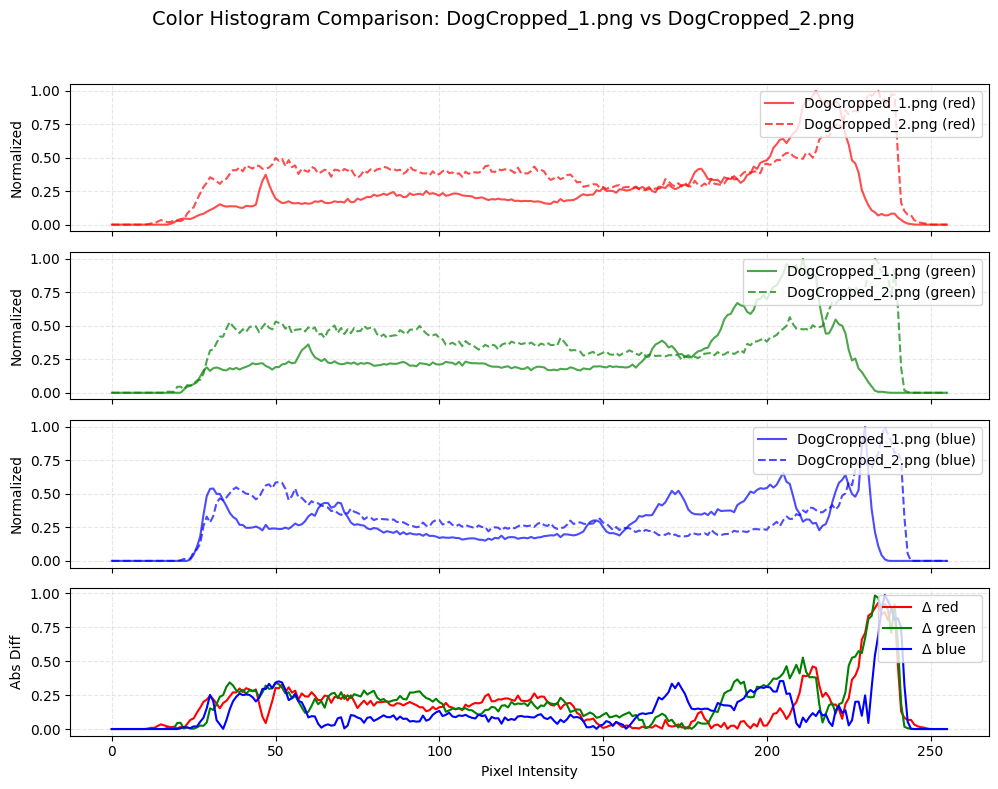

Color histogram difference between DogCropped_1.png vs DogCropped_3.png: 439196


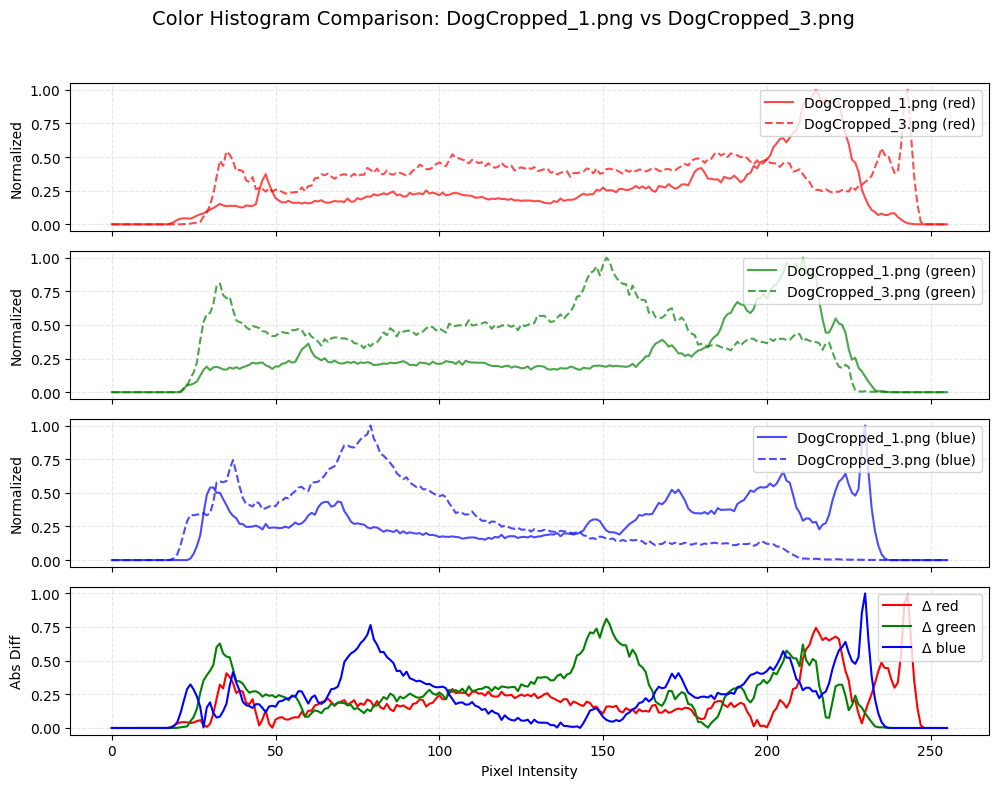

Color histogram difference between DogCropped_2.png vs DogCropped_3.png: 340852


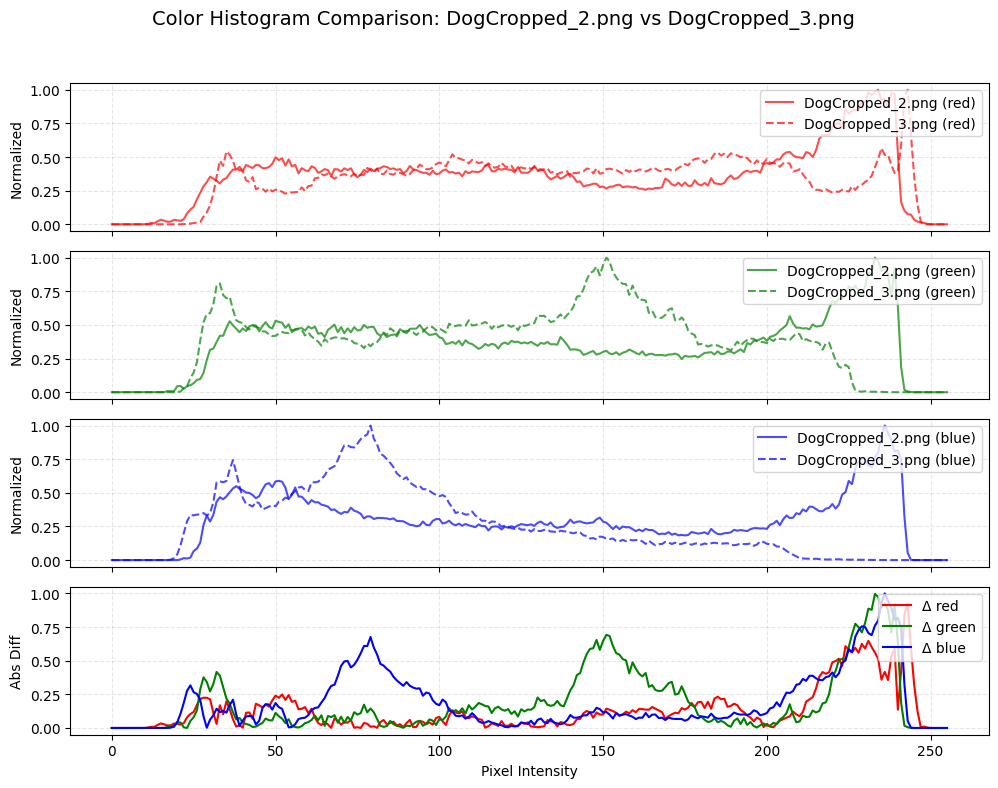

In [111]:
DogImages = ["DogCropped_1.png", "DogCropped_2.png", "DogCropped_3.png"]

# Ensure all images exist
for path in DogImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(DogImages)


Color histogram difference between DogCropped_1_NB.png vs DogCropped_2_NB.png: 68708


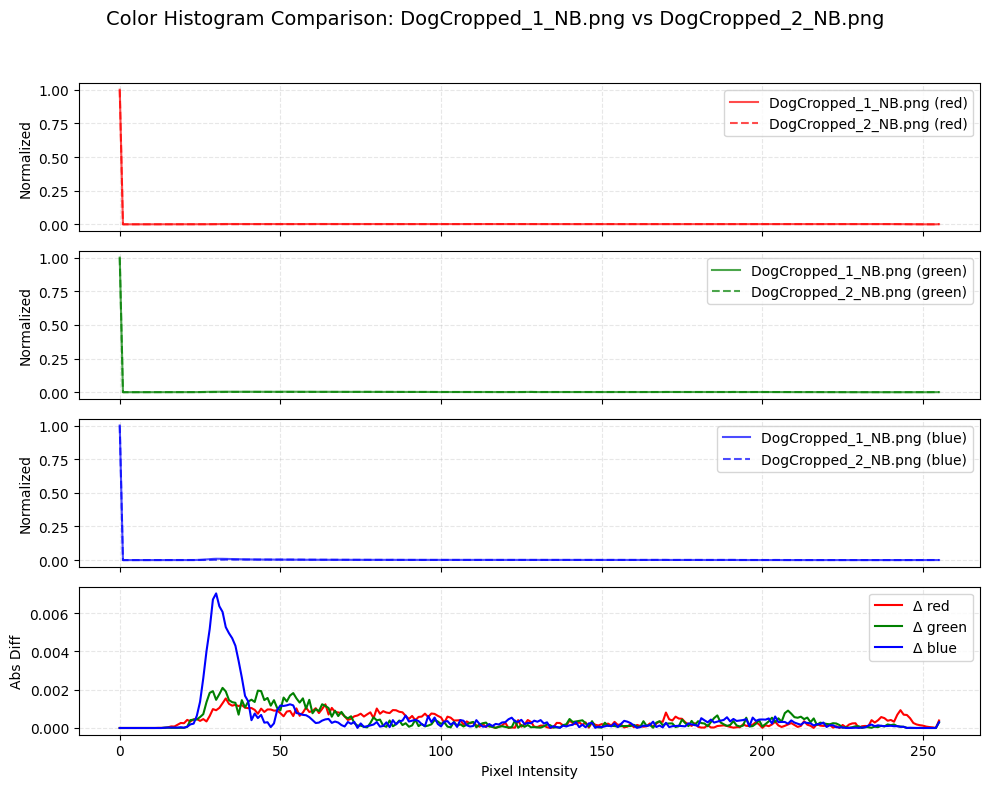

Color histogram difference between DogCropped_1_NB.png vs DogCropped_3_NB.png: 129736


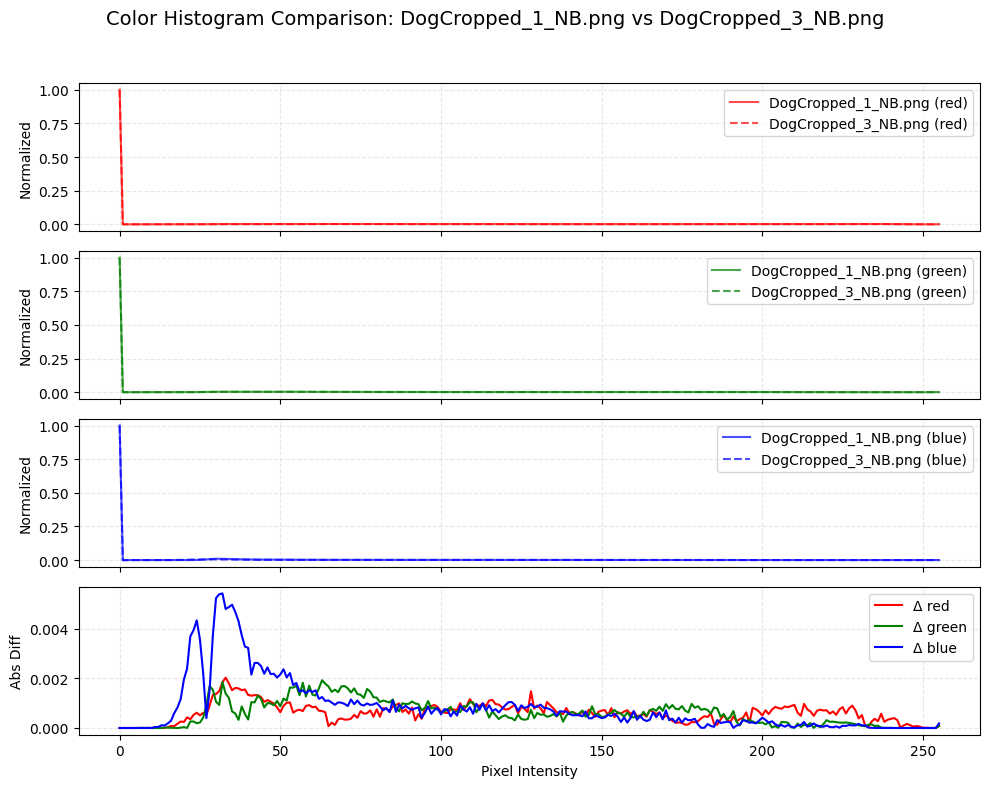

Color histogram difference between DogCropped_2_NB.png vs DogCropped_3_NB.png: 105364


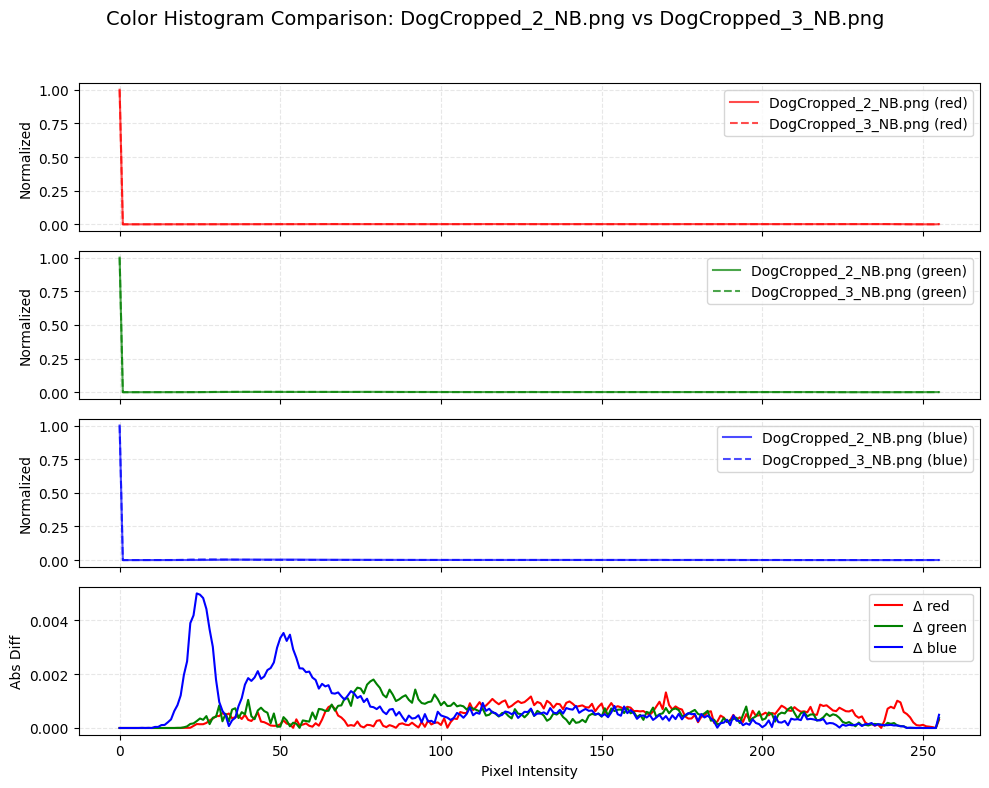

In [112]:
DogImages = ["DogCropped_1_NB.png", "DogCropped_2_NB.png", "DogCropped_3_NB.png"]

# Ensure all images exist
for path in DogImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(DogImages)

### Real Boy

Color histogram difference between RealBoyCropped_1.png vs RealBoyCropped_2.png: 238112


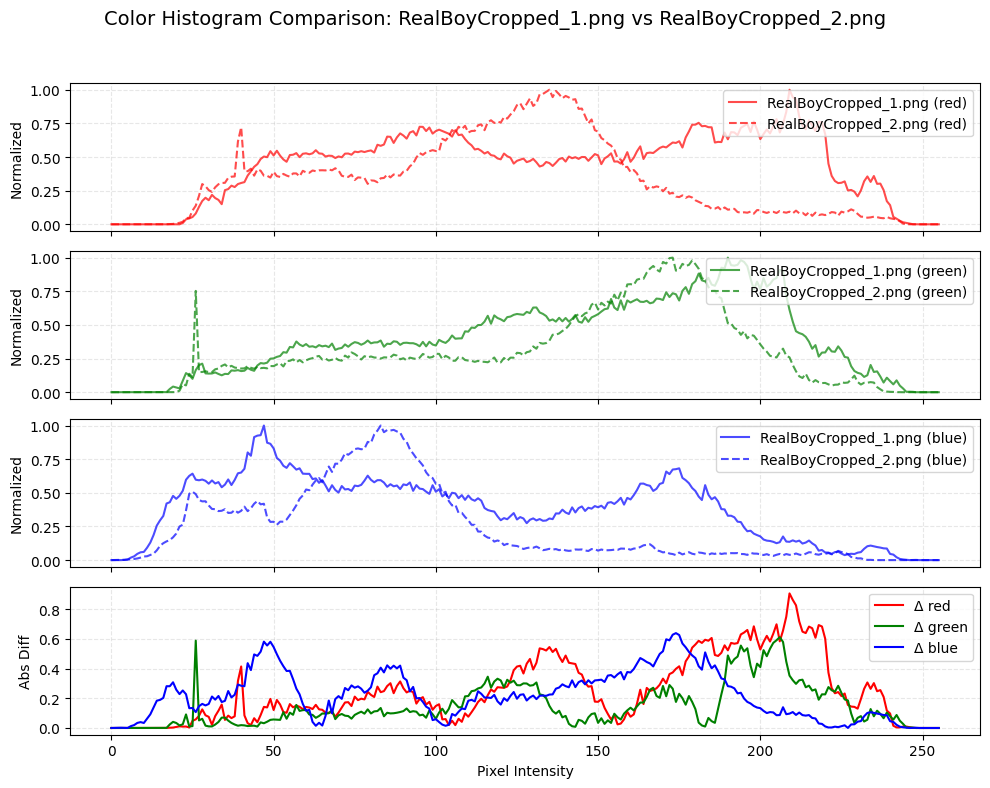

Color histogram difference between RealBoyCropped_1.png vs RealBoyCropped_3.png: 122134


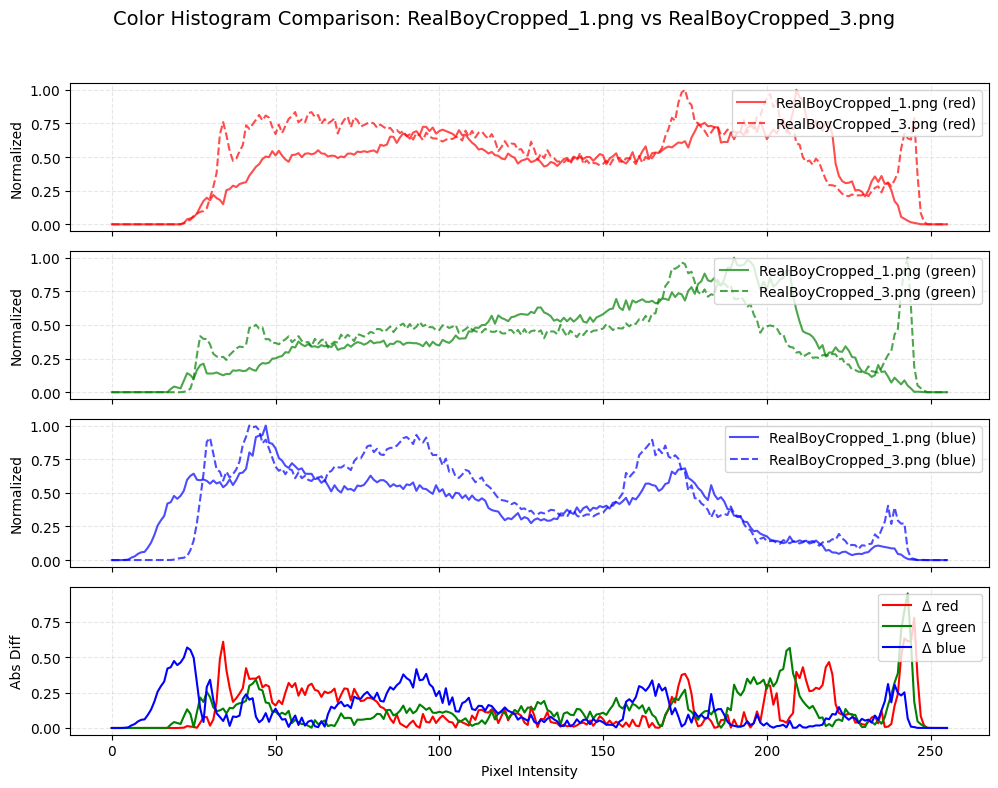

Color histogram difference between RealBoyCropped_2.png vs RealBoyCropped_3.png: 243198


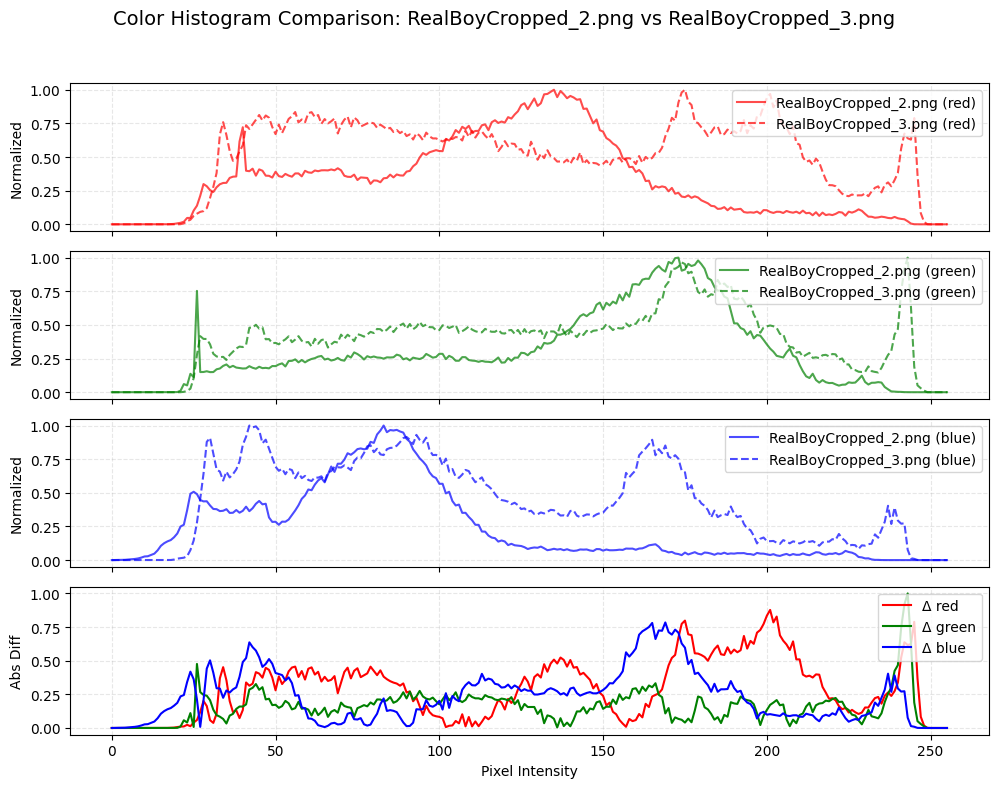

In [113]:
RealBoyImages = ["RealBoyCropped_1.png", "RealBoyCropped_2.png", "RealBoyCropped_3.png"]

# Ensure all images exist
for path in RealBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(RealBoyImages)

Color histogram difference between RealBoyCropped_1_NB.png vs RealBoyCropped_2_NB.png: 17310


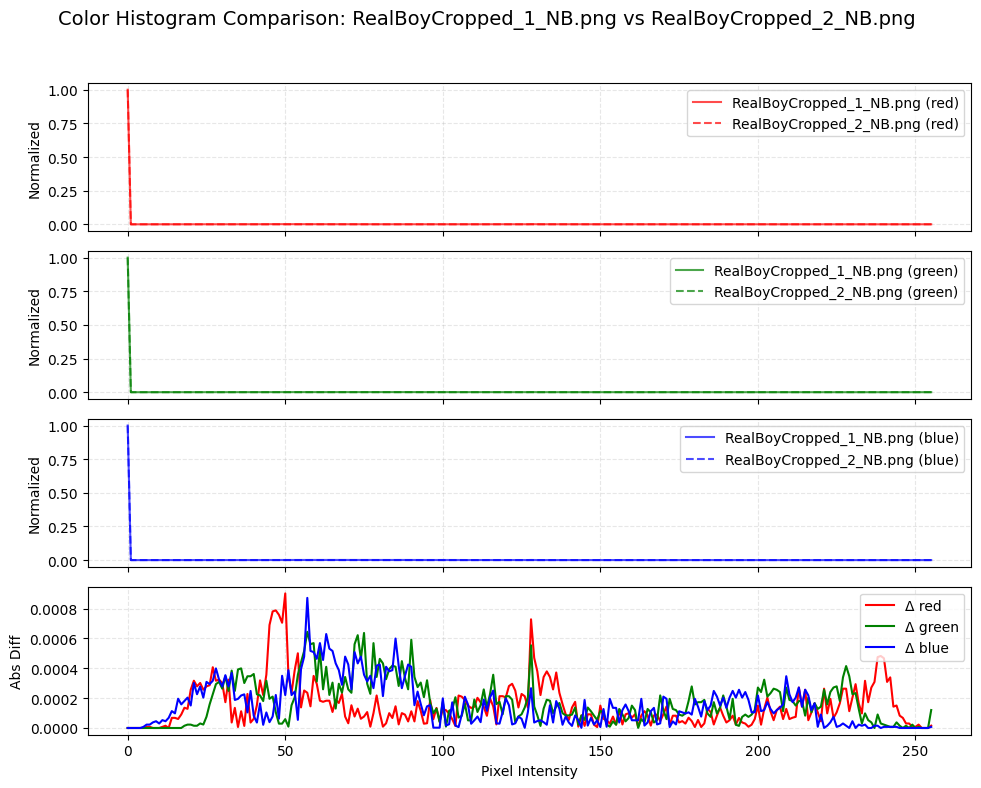

Color histogram difference between RealBoyCropped_1_NB.png vs RealBoyCropped_3_NB.png: 206138


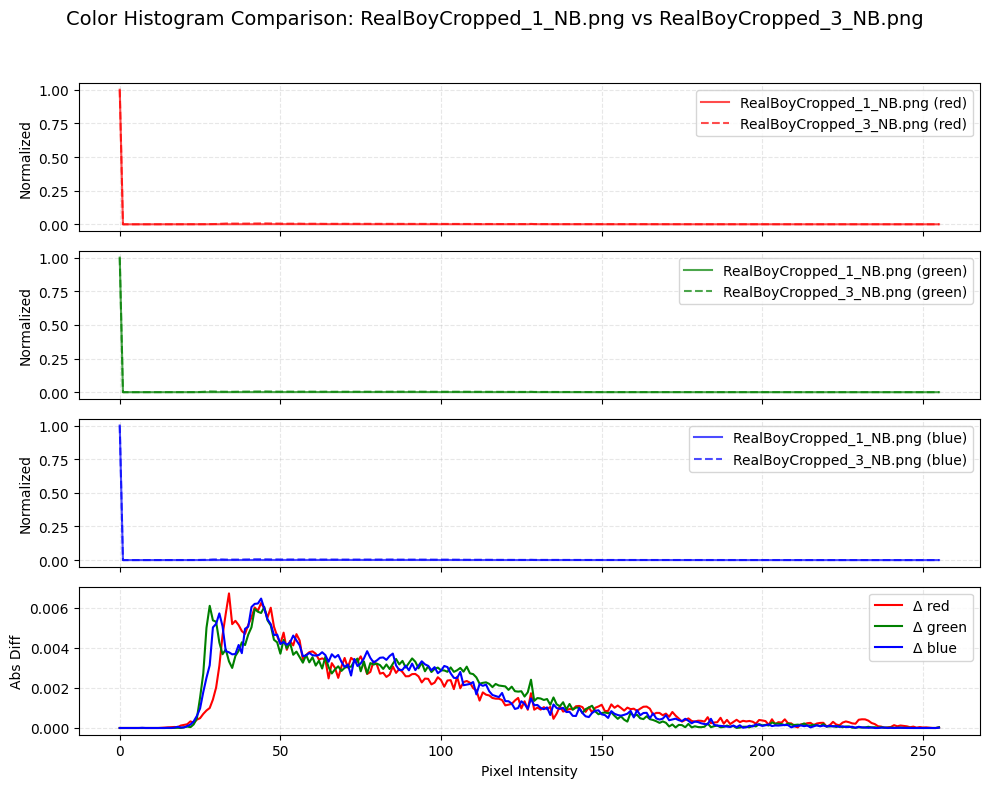

Color histogram difference between RealBoyCropped_2_NB.png vs RealBoyCropped_3_NB.png: 214996


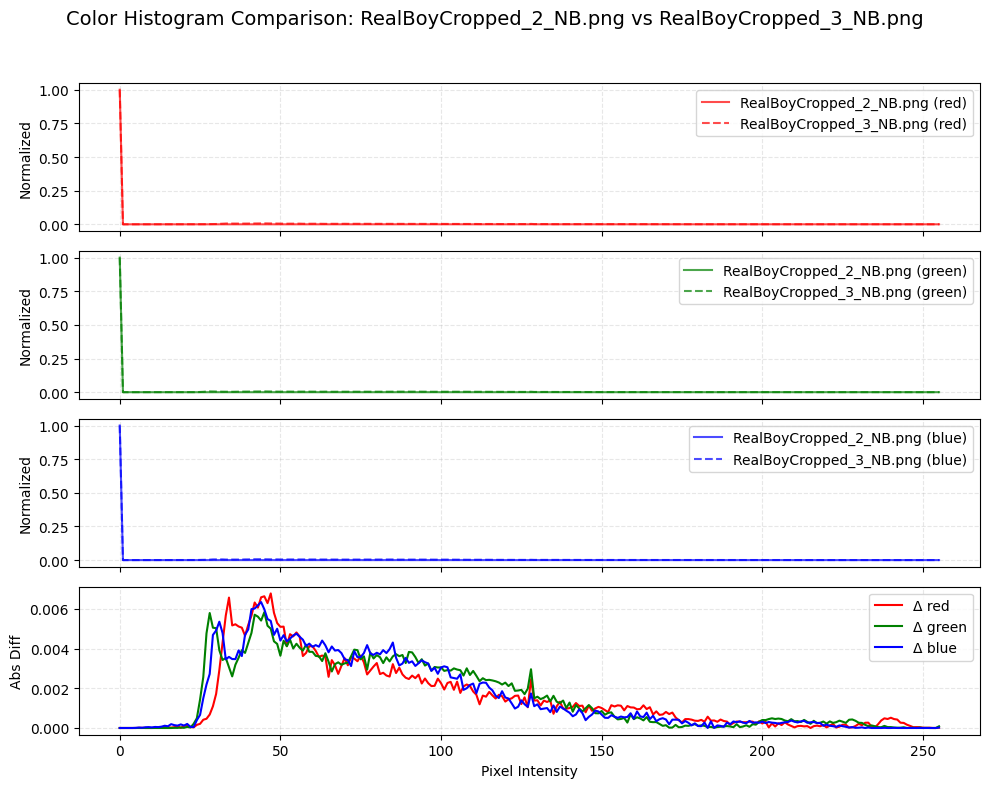

In [114]:
RealBoyImages = ["RealBoyCropped_1_NB.png", "RealBoyCropped_2_NB.png", "RealBoyCropped_3_NB.png"]

# Ensure all images exist
for path in RealBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(RealBoyImages)

### Cartoon Boy

Color histogram difference between CartoonBoyCropped_1.png vs CartoonBoyCropped_2.png: 315048


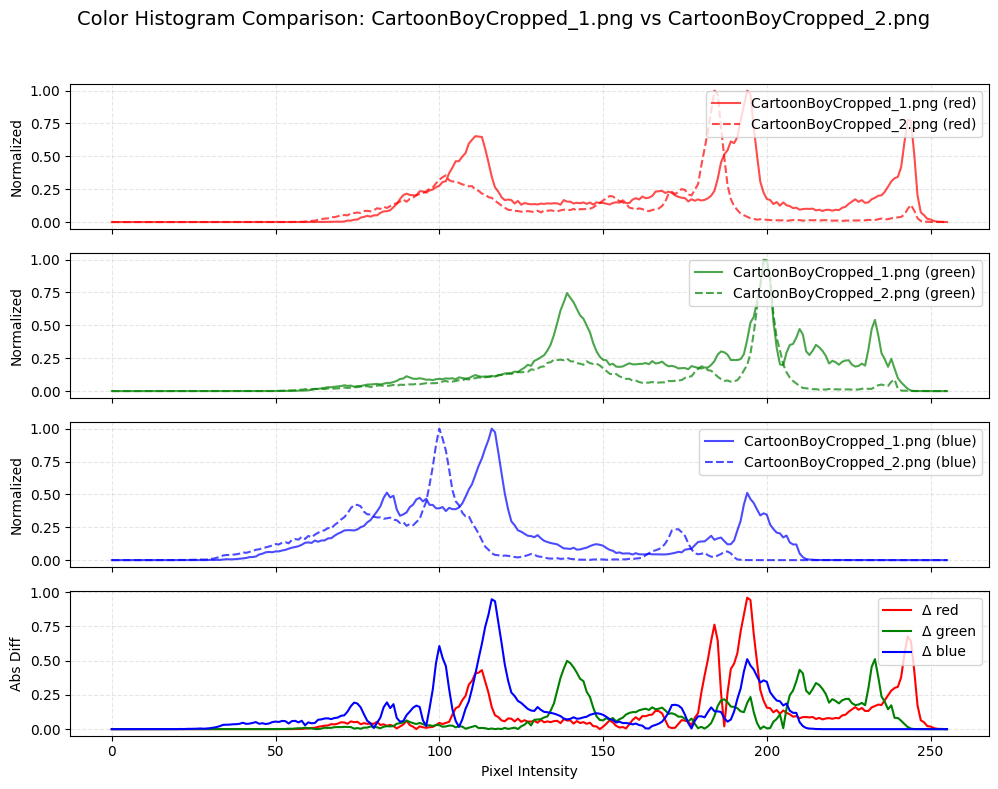

Color histogram difference between CartoonBoyCropped_1.png vs CartoonBoyCropped_3.png: 231058


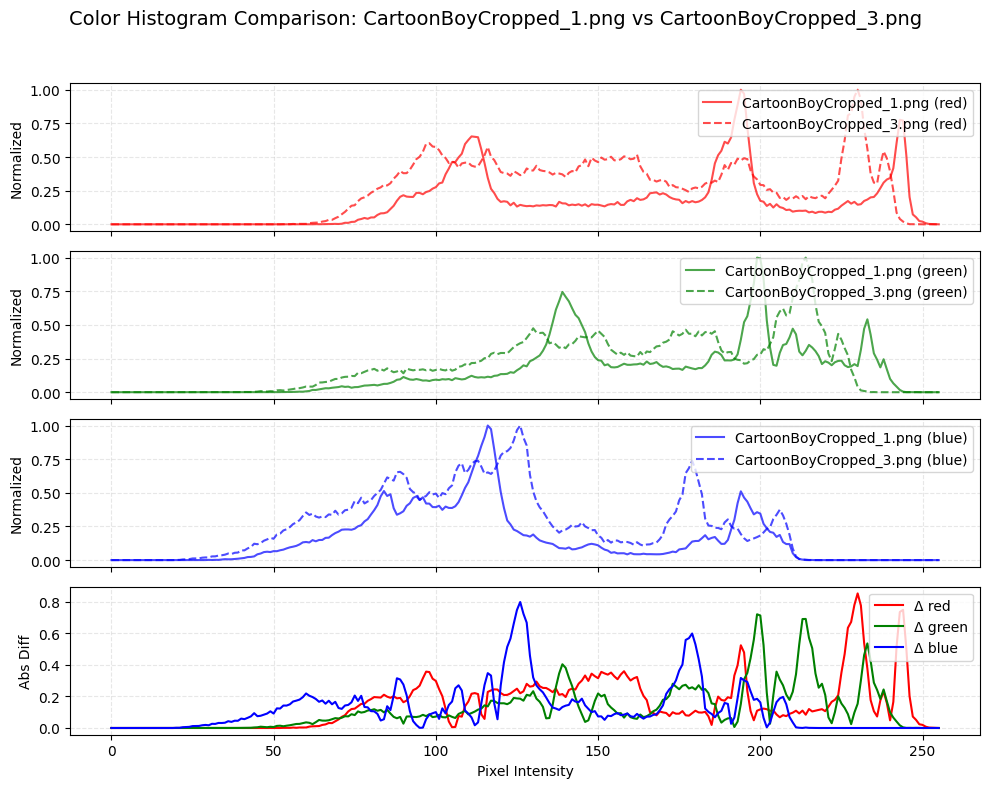

Color histogram difference between CartoonBoyCropped_2.png vs CartoonBoyCropped_3.png: 322232


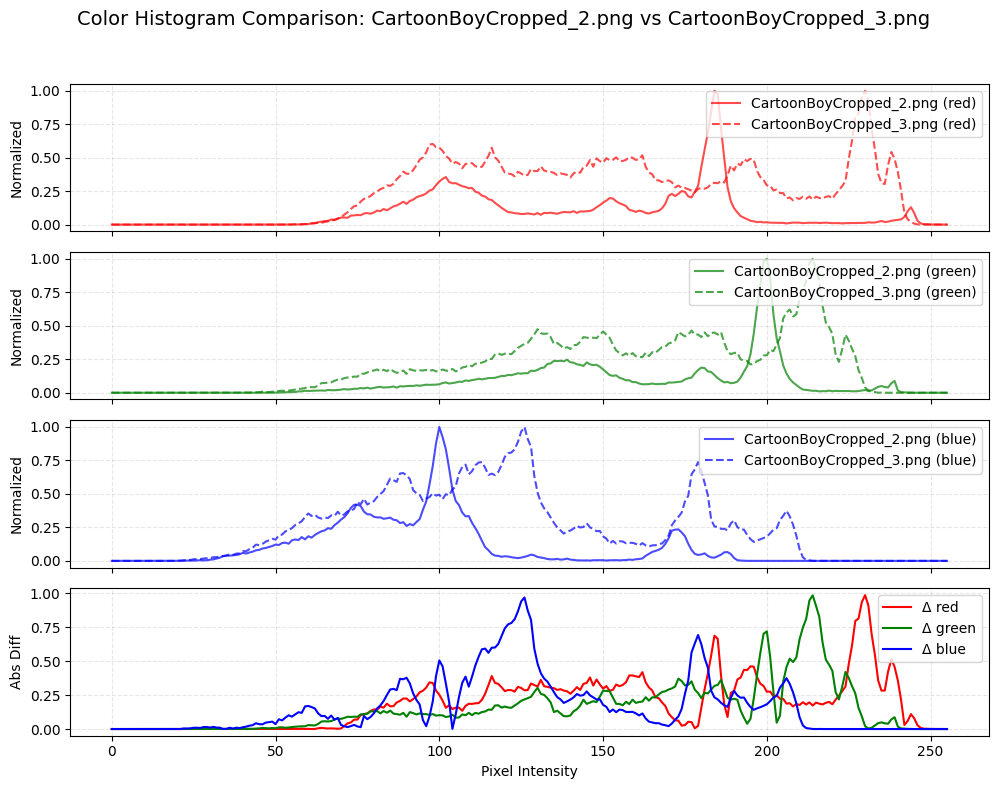

In [115]:
CartoonBoyImages = ["CartoonBoyCropped_1.png", "CartoonBoyCropped_2.png", "CartoonBoyCropped_3.png"]

# Ensure all images exist
for path in CartoonBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(CartoonBoyImages)

Color histogram difference between CartoonBoyCropped_1_NB.png vs CartoonBoyCropped_2_NB.png: 21040


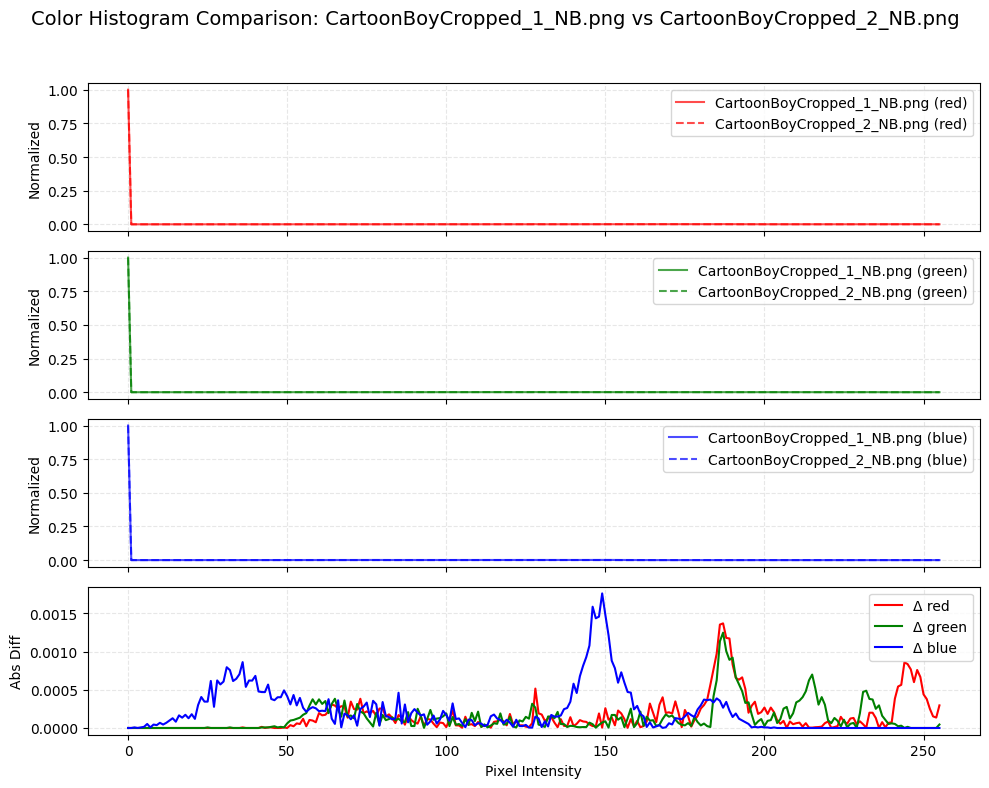

Color histogram difference between CartoonBoyCropped_1_NB.png vs CartoonBoyCropped_3_NB.png: 29514


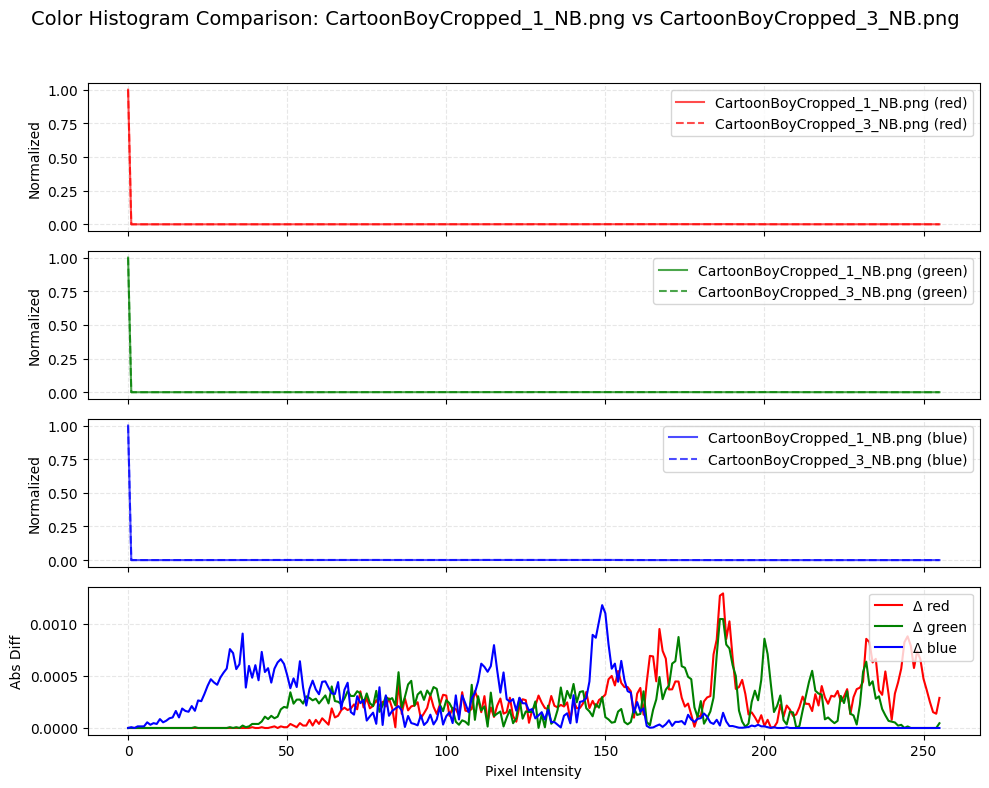

Color histogram difference between CartoonBoyCropped_2_NB.png vs CartoonBoyCropped_3_NB.png: 26968


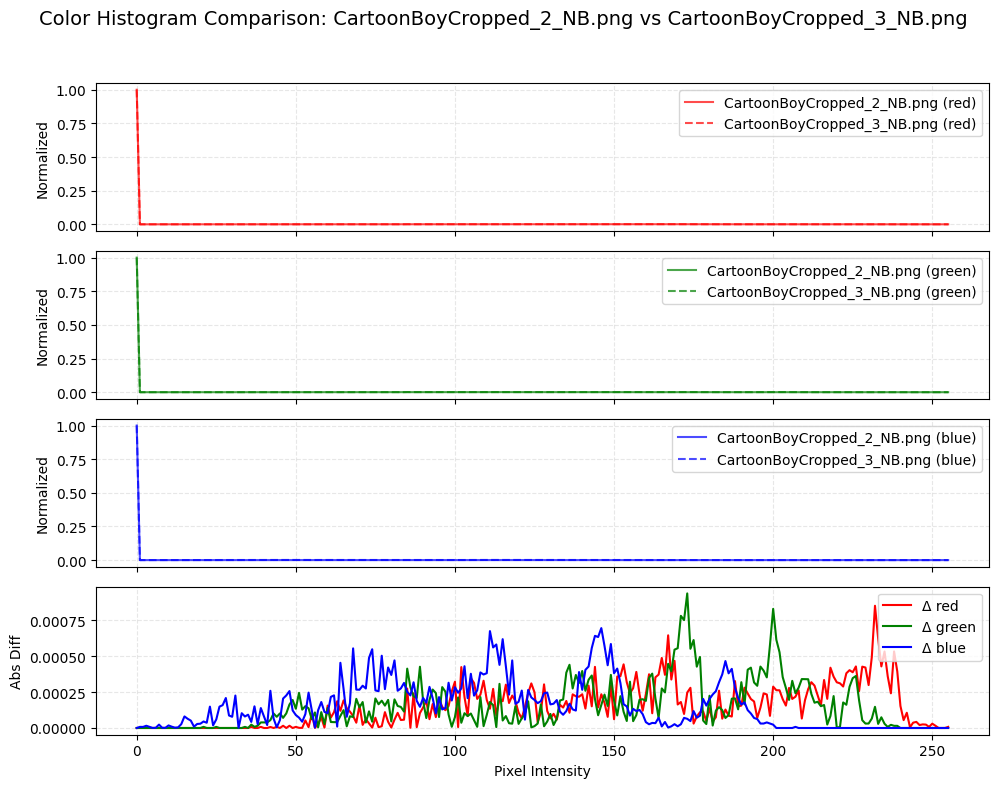

In [116]:
CartoonBoyImages = ["CartoonBoyCropped_1_NB.png", "CartoonBoyCropped_2_NB.png", "CartoonBoyCropped_3_NB.png"]

# Ensure all images exist
for path in CartoonBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(CartoonBoyImages)

### A bit more informative

# Color Histogram (EMD/ Wasserstein Distance)

In [117]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Create color histogram for each image
def calculate_color_histogram(image):
    """Calculate color histogram for an image."""
    hist = np.zeros((256, 3), dtype=int)
    for channel in range(3):  # Assuming RGB
        hist[:, channel], _ = np.histogram(image[:, :, channel], bins=256, range=(0, 255))
    return hist

In [118]:
from scipy.stats import wasserstein_distance

def compare_color_histograms_emd(hist1, hist2):
    emd_total = 0
    for c in range(3):  # RGB channels
        emd_total += wasserstein_distance(np.arange(256), np.arange(256), u_weights=hist1[:, c], v_weights=hist2[:, c])
    return emd_total


In [119]:
def plot_histogram_comparison(hist1, hist2, title1, title2, image_pair_label):
    colors = ['red', 'green', 'blue']
    
    # Normalize histograms to [0, 1] for better comparison
    hist1_norm = hist1 / hist1.max(axis=0)
    hist2_norm = hist2 / hist2.max(axis=0)
    hist_diff = np.abs(hist1_norm - hist2_norm)

    fig, axs = plt.subplots(4, 1, figsize=(10, 8), sharex=True)

    for i in range(3):
        axs[i].plot(hist1_norm[:, i], color=colors[i], label=f"{title1} ({colors[i]})", alpha=0.7)
        axs[i].plot(hist2_norm[:, i], color=colors[i], linestyle='--', label=f"{title2} ({colors[i]})", alpha=0.7)
        axs[i].set_ylabel("Normalized")
        axs[i].legend(loc="upper right")
        axs[i].grid(True, linestyle='--', alpha=0.3)

    # Plot absolute difference
    for i, color in enumerate(colors):
        axs[3].plot(hist_diff[:, i], color=colors[i], label=f"Δ {colors[i]}")
    axs[3].set_ylabel("Abs Diff")
    axs[3].set_xlabel("Pixel Intensity")
    axs[3].legend(loc="upper right")
    axs[3].grid(True, linestyle='--', alpha=0.3)

    plt.suptitle(f"Color Histogram Comparison: {image_pair_label}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [120]:
# Compare color histograms of image pairs and visualize
def compare_color_histograms_for_images(image_paths):
    """Compare color histograms for each pair of images in the given list."""
    histogram_differences = {}
    for i in range(len(image_paths)):
        img1 = io.imread(image_paths[i])
        hist1 = calculate_color_histogram(img1)
        for j in range(i + 1, len(image_paths)):
            img2 = io.imread(image_paths[j])
            hist2 = calculate_color_histogram(img2)
            difference = compare_color_histograms_emd(hist1, hist2)
            pair_label = f"{os.path.basename(image_paths[i])} vs {os.path.basename(image_paths[j])}"
            print(f"Color histogram difference between {pair_label}: {difference}")
            histogram_differences[(image_paths[i], image_paths[j])] = difference
            plot_histogram_comparison(hist1, hist2, os.path.basename(image_paths[i]), os.path.basename(image_paths[j]), pair_label)
    return histogram_differences

### Dog

Color histogram difference between DogCropped_1.png vs DogCropped_2.png: 49.687713199851686


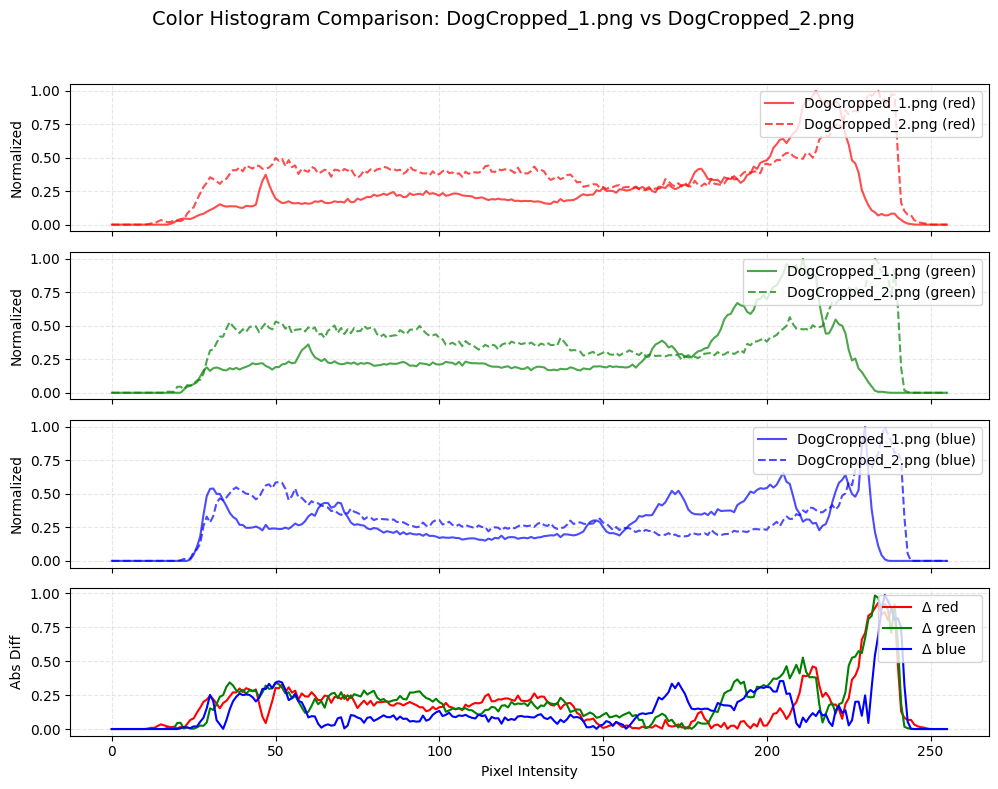

Color histogram difference between DogCropped_1.png vs DogCropped_3.png: 101.36352892102336


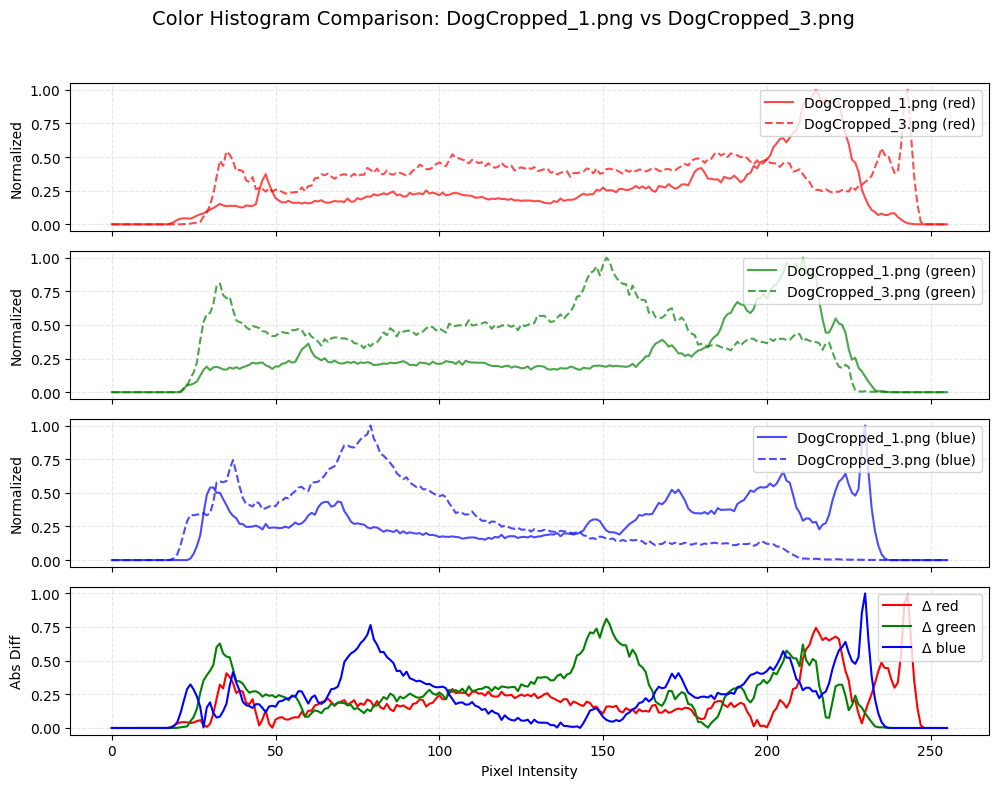

Color histogram difference between DogCropped_2.png vs DogCropped_3.png: 73.04699666295883


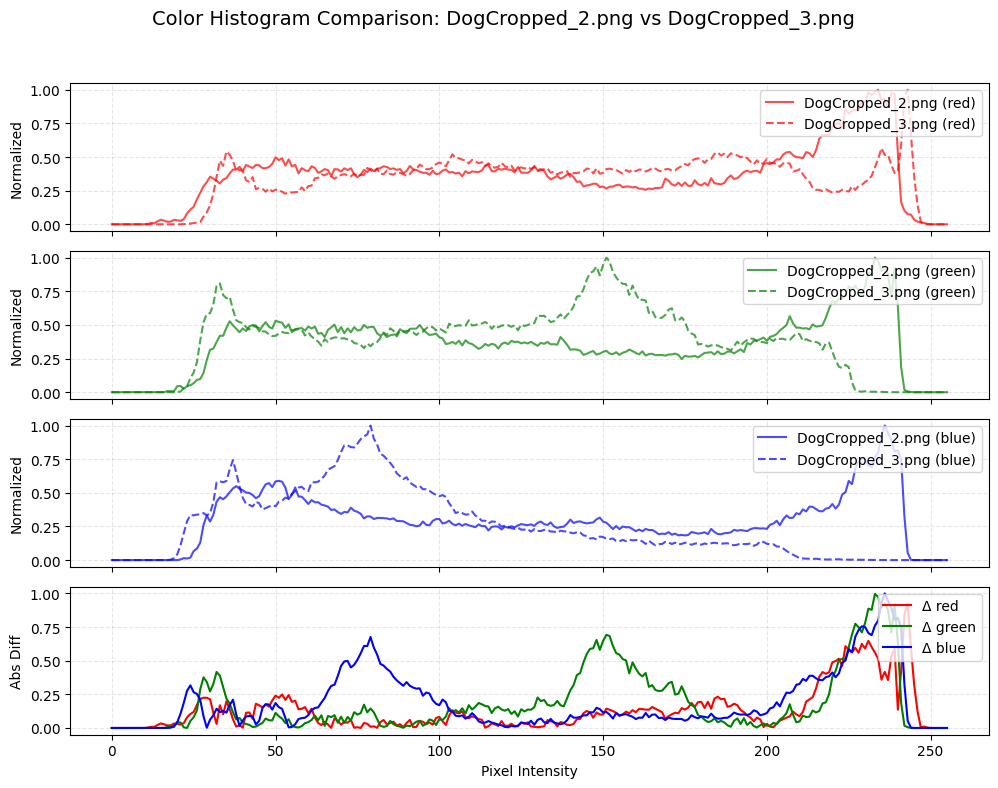

In [122]:
DogImages = ["DogCropped_1.png", "DogCropped_2.png", "DogCropped_3.png"]

# Ensure all images exist
for path in DogImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(DogImages)

Color histogram difference between DogCropped_1_NB.png vs DogCropped_2_NB.png: 8.63246199480905


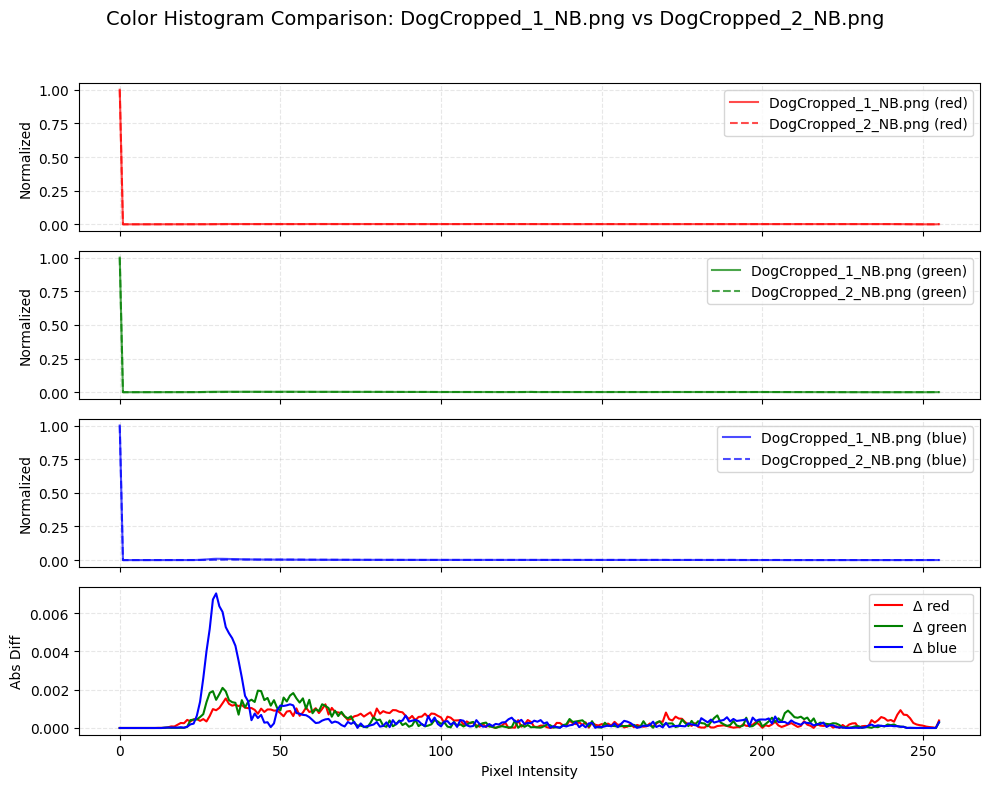

Color histogram difference between DogCropped_1_NB.png vs DogCropped_3_NB.png: 25.673609566184645


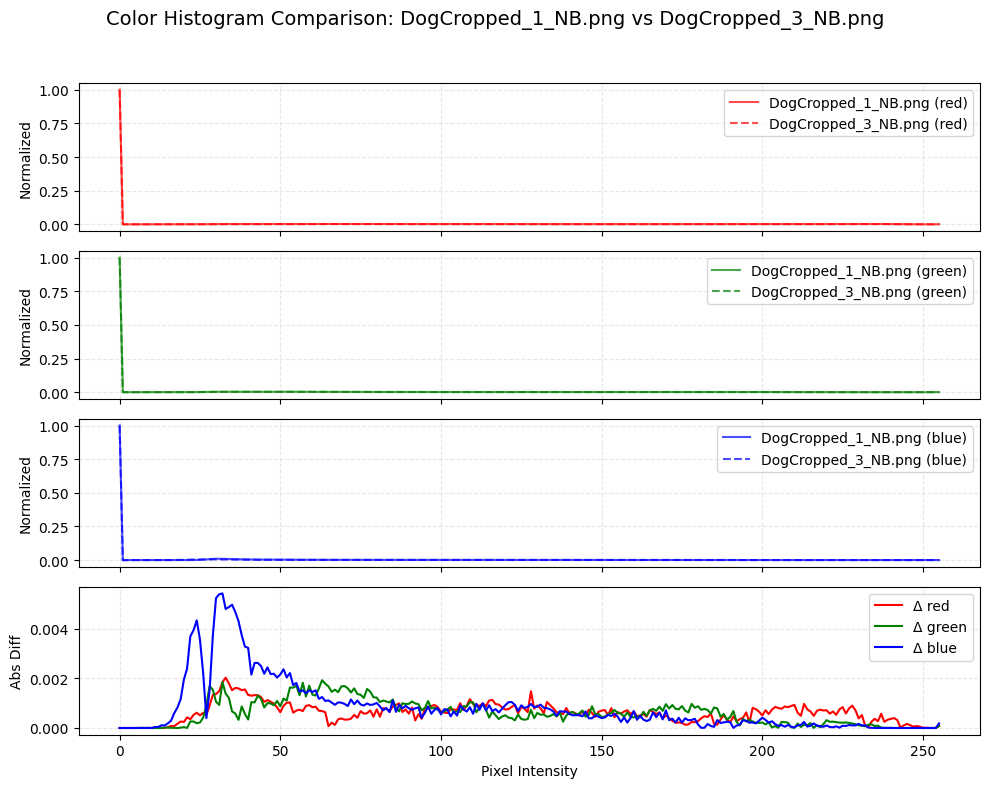

Color histogram difference between DogCropped_2_NB.png vs DogCropped_3_NB.png: 27.648841305153873


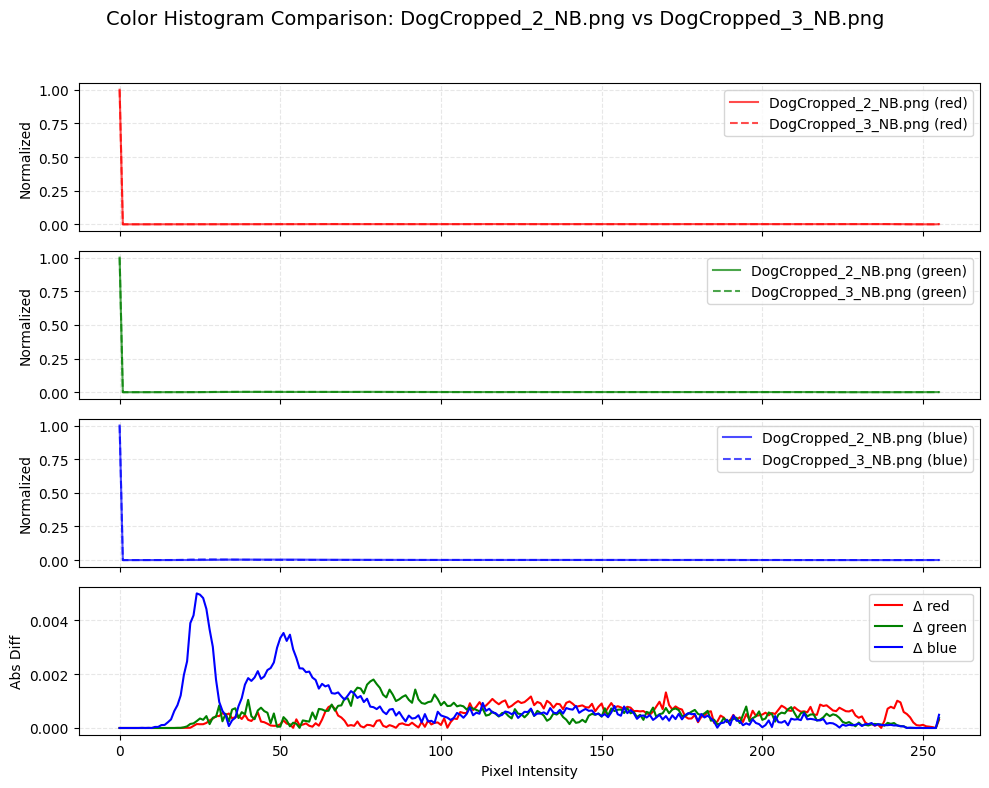

In [121]:
DogImages = ["DogCropped_1_NB.png", "DogCropped_2_NB.png", "DogCropped_3_NB.png"]

# Ensure all images exist
for path in DogImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(DogImages)

### Real Boy

Color histogram difference between RealBoyCropped_1.png vs RealBoyCropped_2.png: 52.29491042910706


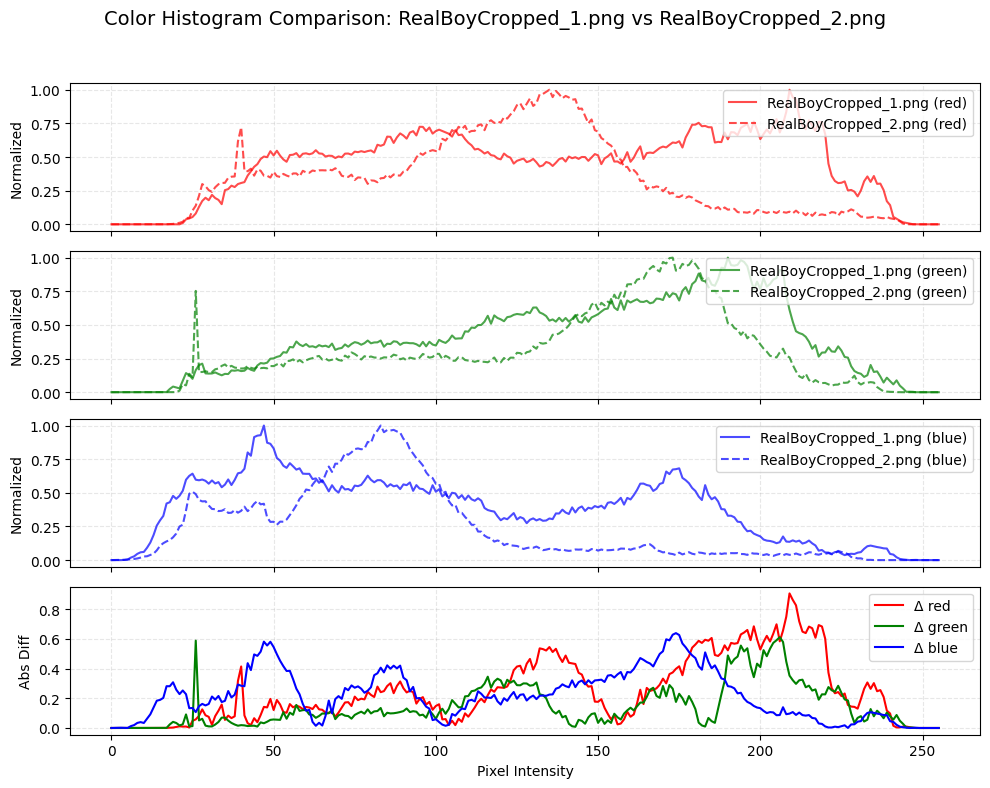

Color histogram difference between RealBoyCropped_1.png vs RealBoyCropped_3.png: 26.39510484654909


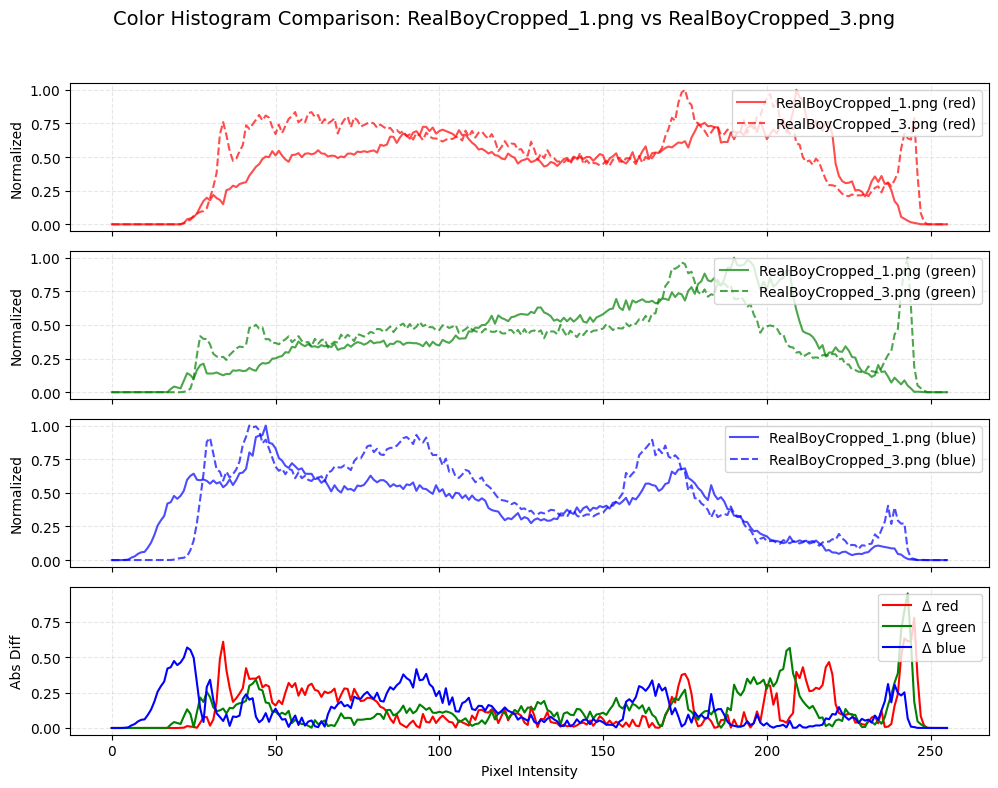

Color histogram difference between RealBoyCropped_2.png vs RealBoyCropped_3.png: 58.643216219969446


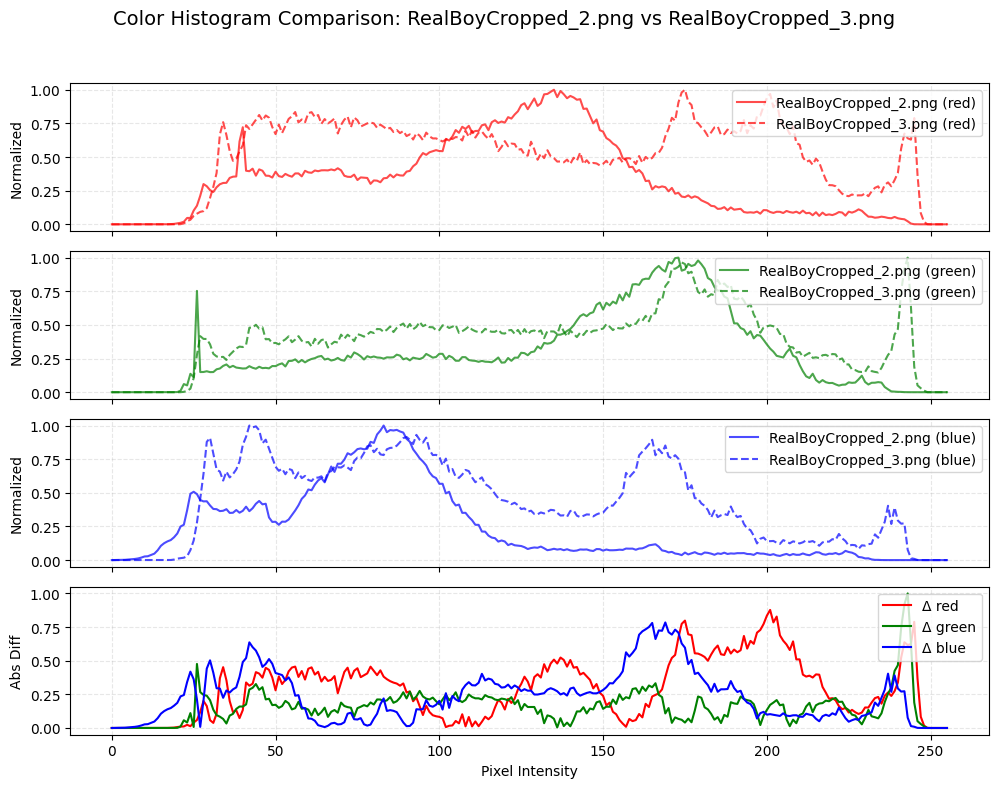

In [123]:
RealBoyImages = ["RealBoyCropped_1.png", "RealBoyCropped_2.png", "RealBoyCropped_3.png"]

# Ensure all images exist
for path in RealBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(RealBoyImages)

Color histogram difference between RealBoyCropped_1_NB.png vs RealBoyCropped_2_NB.png: 3.887147618386334


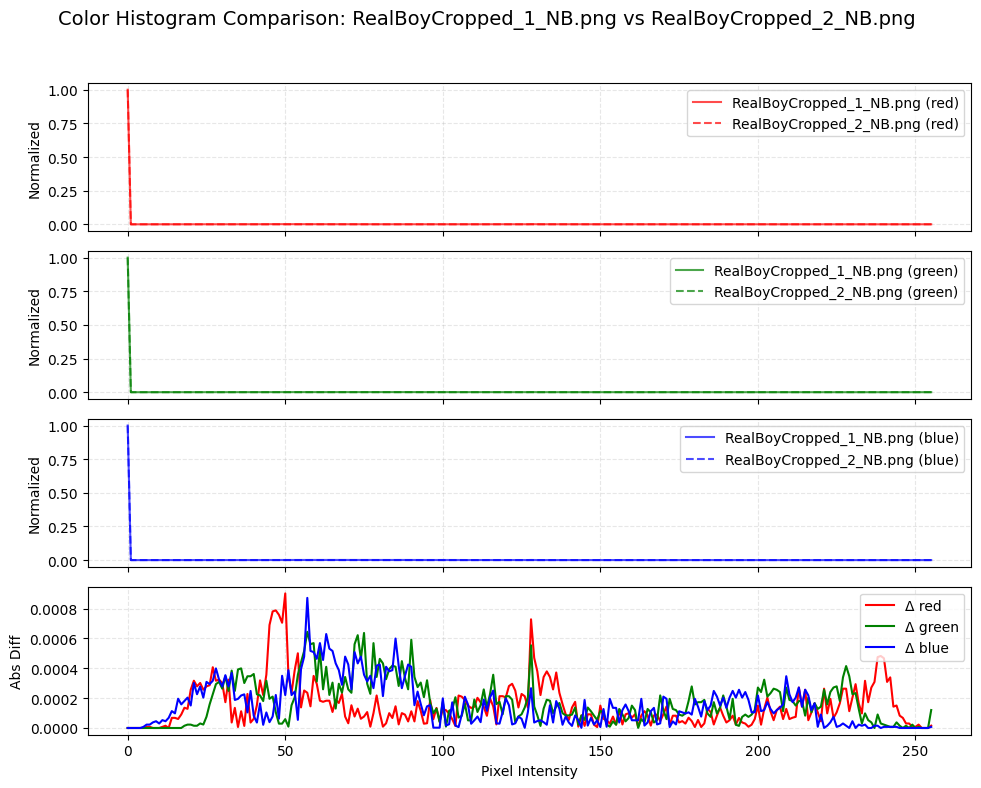

Color histogram difference between RealBoyCropped_1_NB.png vs RealBoyCropped_3_NB.png: 53.35957505901959


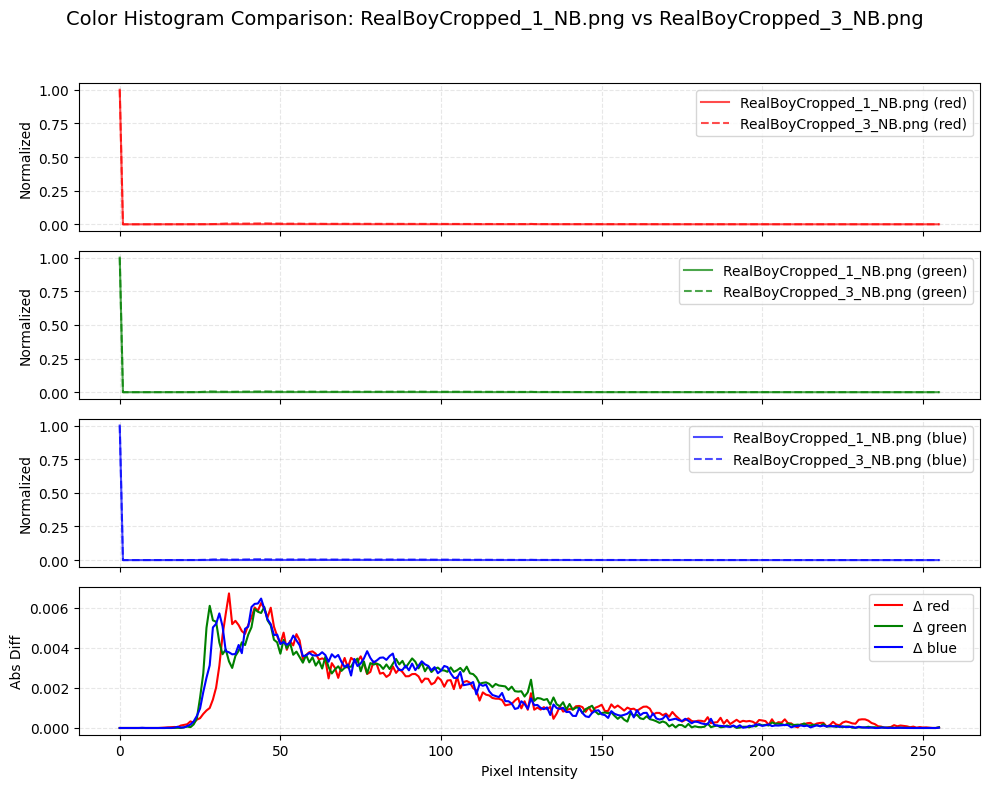

Color histogram difference between RealBoyCropped_2_NB.png vs RealBoyCropped_3_NB.png: 53.84500069434801


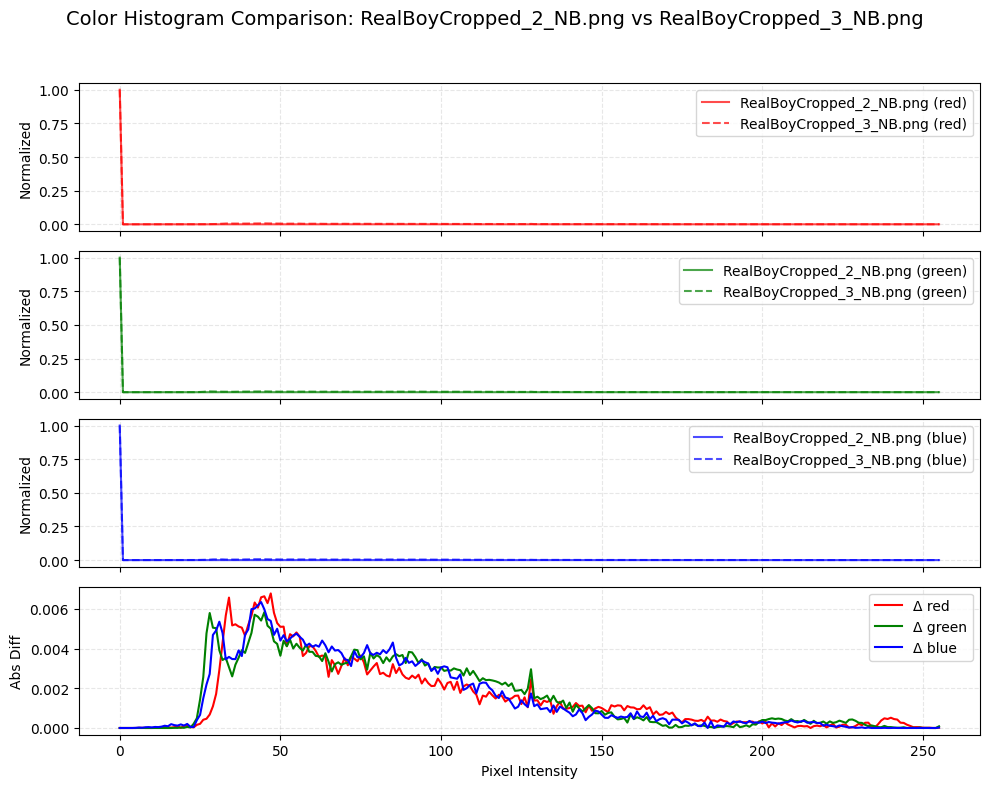

In [124]:
RealBoyImages = ["RealBoyCropped_1_NB.png", "RealBoyCropped_2_NB.png", "RealBoyCropped_3_NB.png"]

# Ensure all images exist
for path in RealBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(RealBoyImages)

### Cartoon Boy

Color histogram difference between CartoonBoyCropped_1.png vs CartoonBoyCropped_2.png: 55.43840155945419


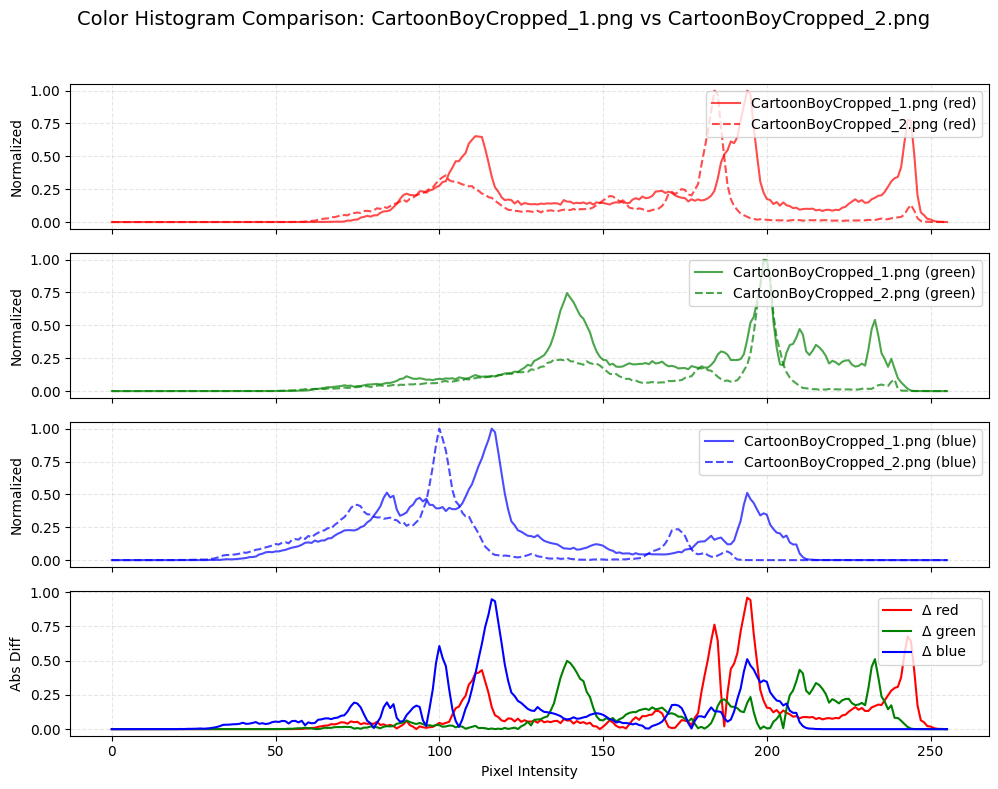

Color histogram difference between CartoonBoyCropped_1.png vs CartoonBoyCropped_3.png: 22.670537454747983


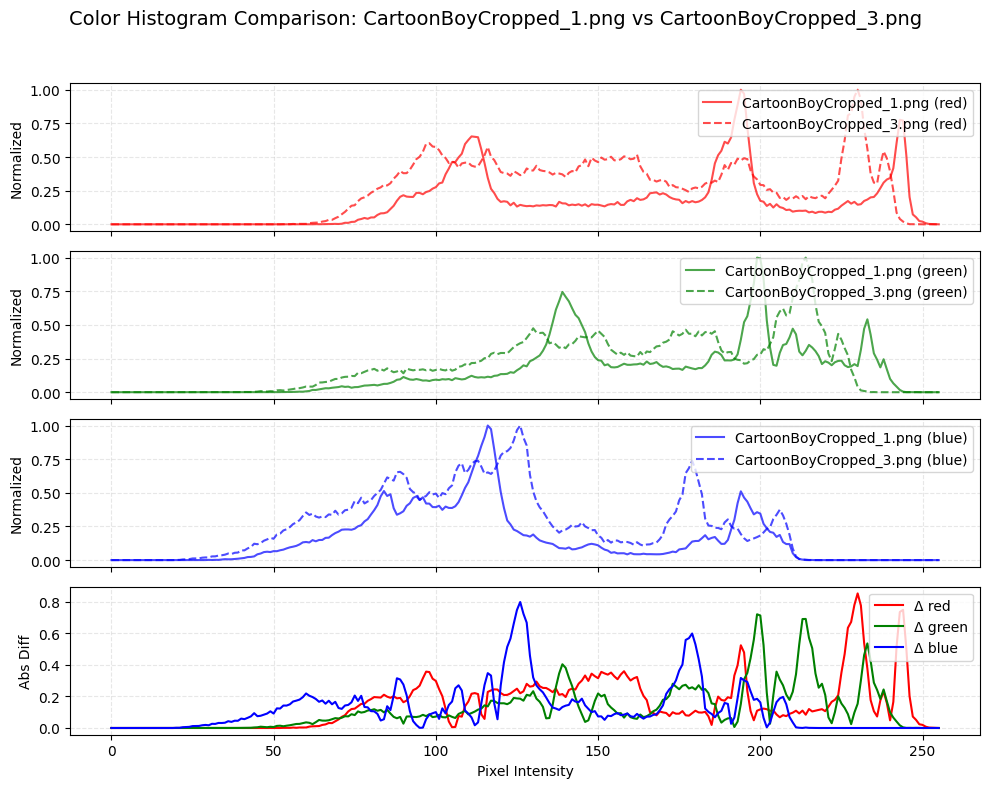

Color histogram difference between CartoonBoyCropped_2.png vs CartoonBoyCropped_3.png: 43.42474241158452


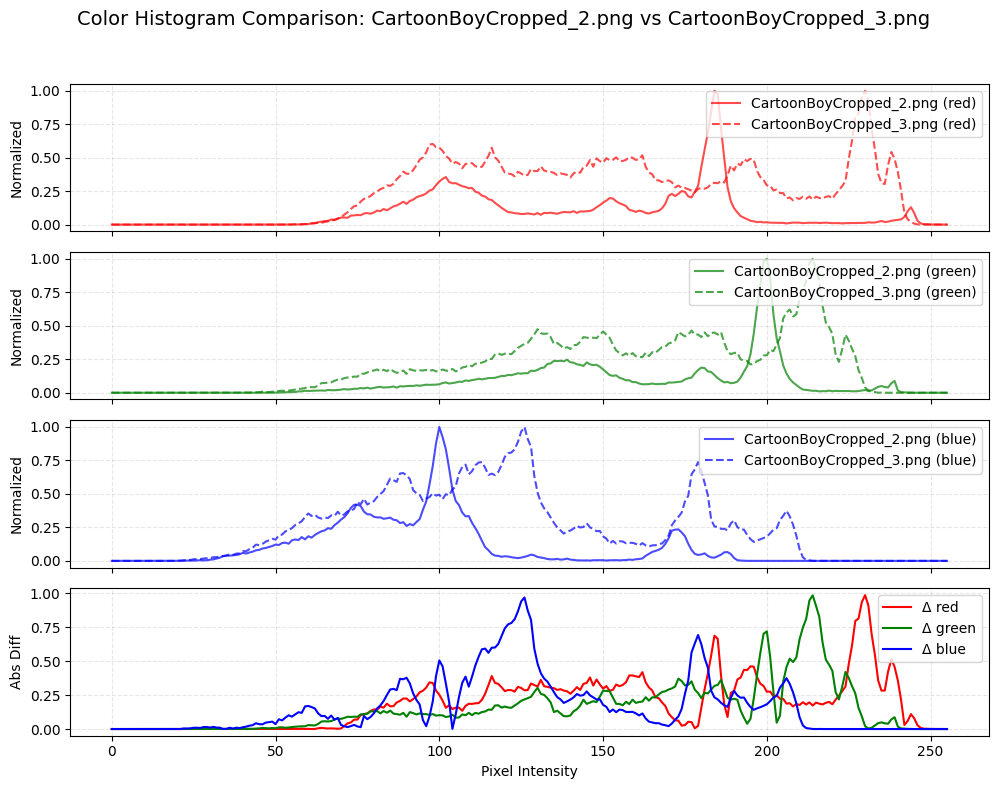

In [125]:
CartoonBoyImages = ["CartoonBoyCropped_1.png", "CartoonBoyCropped_2.png", "CartoonBoyCropped_3.png"]

# Ensure all images exist
for path in CartoonBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(CartoonBoyImages)

Color histogram difference between CartoonBoyCropped_1_NB.png vs CartoonBoyCropped_2_NB.png: 9.271964633806736


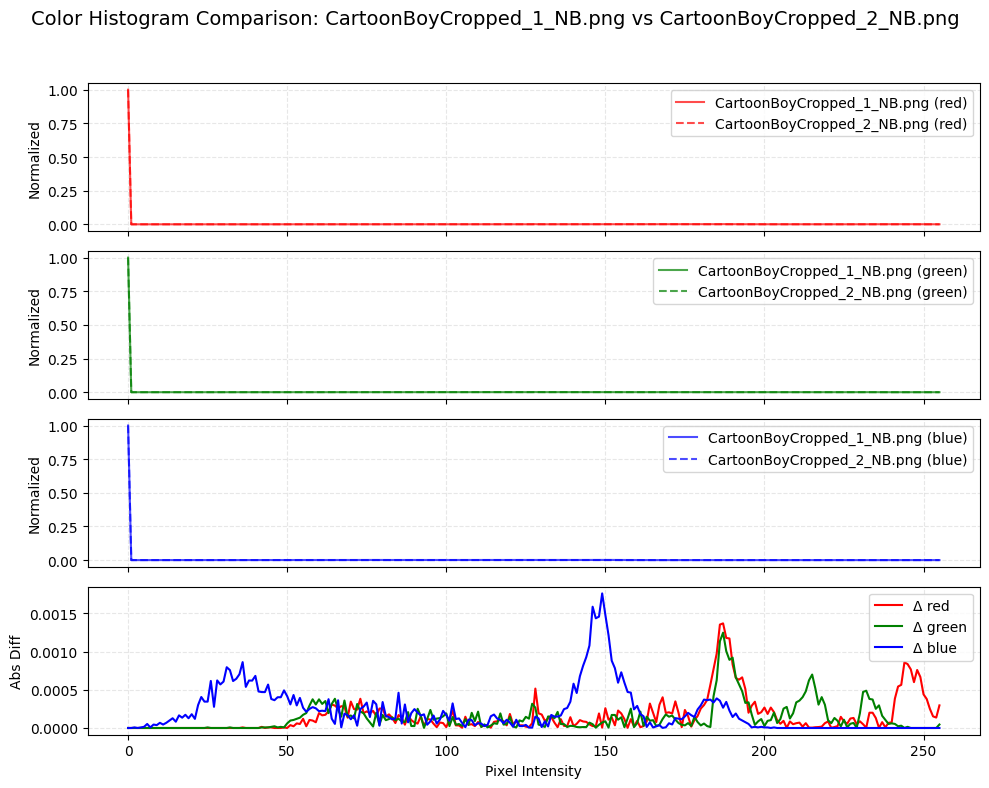

Color histogram difference between CartoonBoyCropped_1_NB.png vs CartoonBoyCropped_3_NB.png: 6.115336953494849


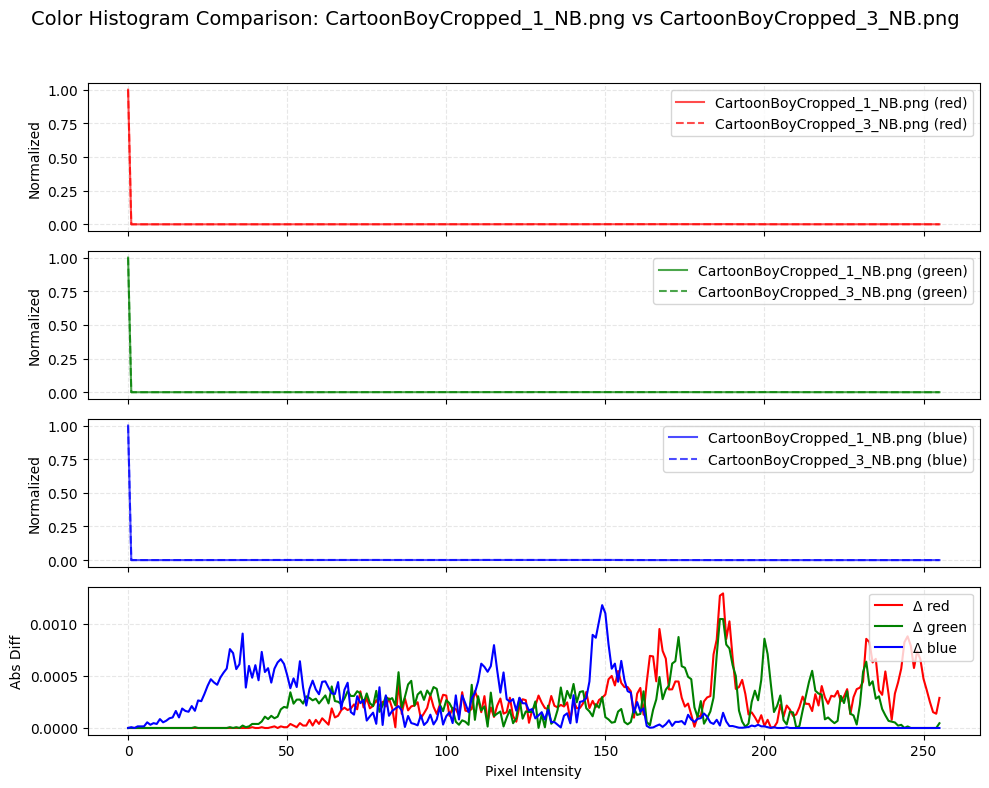

Color histogram difference between CartoonBoyCropped_2_NB.png vs CartoonBoyCropped_3_NB.png: 13.339167362851573


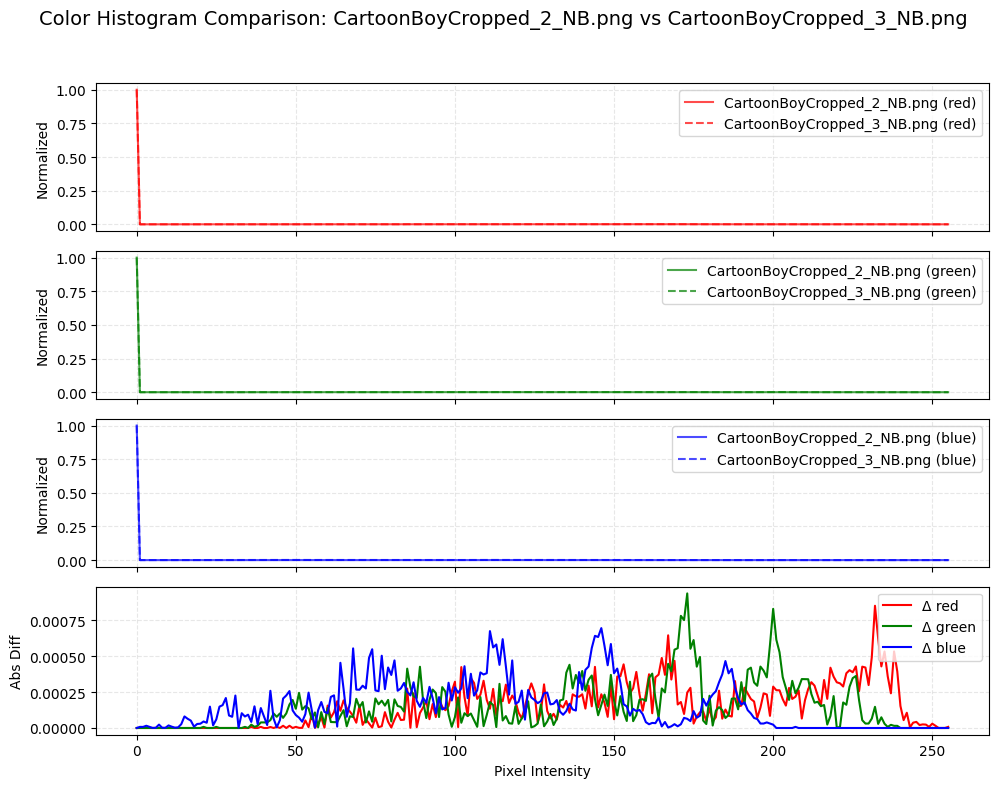

In [126]:
CartoonBoyImages = ["CartoonBoyCropped_1_NB.png", "CartoonBoyCropped_2_NB.png", "CartoonBoyCropped_3_NB.png"]

# Ensure all images exist
for path in CartoonBoyImages:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Image {path} does not exist.")

# Run comparison and visualize
histogram_results = compare_color_histograms_for_images(CartoonBoyImages)

# CLIP Embeddings

In [3]:
# create clip embedding for image
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel

def load_clip_model(device="cuda" if torch.cuda.is_available() else "cpu"):
    """Load Hugging Face CLIP model and processor."""
    model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
    processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
    model.eval()
    return model, processor, device

def get_clip_embedding(image_path, model, processor, device):
    """Get CLIP embedding for a single image."""
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        embedding = model.get_image_features(**inputs)
    return embedding.cpu().numpy()

def get_clip_embeddings_for_images(image_paths):
    """Get CLIP embeddings for a list of images."""
    model, processor, device = load_clip_model()
    embeddings = {}
    for path in image_paths:
        embedding = get_clip_embedding(path, model, processor, device)
        embeddings[path] = embedding
    return embeddings


c:\Users\zeina\Desktop\ImagesEvaluation\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
# compare CLIP embeddings of image pairs in a list
import numpy as np
def compare_clip_embeddings(embeddings):
    """Compare CLIP embeddings of image pairs and return cosine similarity."""
    similarities = {}
    for i in range(len(embeddings)):
        path1 = list(embeddings.keys())[i]
        emb1 = embeddings[path1]
        for j in range(i + 1, len(embeddings)):
            path2 = list(embeddings.keys())[j]
            emb2 = embeddings[path2]
            # Compute cosine similarity
            sim = np.dot(emb1, emb2.T) / (np.linalg.norm(emb1) * np.linalg.norm(emb2))
            similarities[(path1, path2)] = sim.item()  # Convert to scalar
            print(f"Cosine similarity between {path1} and {path2}: {sim.item():.4f}")
    return similarities

In [5]:
# visualize CLIP embeddings
import matplotlib.pyplot as plt

def plot_clip_embeddings(embeddings):
    """Plot CLIP embeddings in 2D using PCA."""
    from sklearn.decomposition import PCA

    # Stack embeddings and apply PCA
    all_embeddings = np.vstack(list(embeddings.values()))
    pca = PCA(n_components=2)
    reduced_embeddings = pca.fit_transform(all_embeddings)

    # Plot the reduced embeddings
    plt.figure(figsize=(10, 8))
    for i, (path, emb) in enumerate(embeddings.items()):
        plt.scatter(reduced_embeddings[i, 0], reduced_embeddings[i, 1], label=os.path.basename(path))
        plt.annotate(os.path.basename(path), (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9)

    plt.title("CLIP Embeddings Visualization")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend()
    plt.grid(True)
    plt.show()


In [142]:
# Example usage
image_paths = ["DogCropped_1.png", "DogCropped_2.png", "DogCropped_3.png"]
# Get CLIP embeddings for the images
embeddings = get_clip_embeddings_for_images(image_paths)
# Compare CLIP embeddings of image pairs
similarities = compare_clip_embeddings(embeddings)

Cosine similarity between DogCropped_1.png and DogCropped_2.png: 0.8738
Cosine similarity between DogCropped_1.png and DogCropped_3.png: 0.9053
Cosine similarity between DogCropped_2.png and DogCropped_3.png: 0.8841


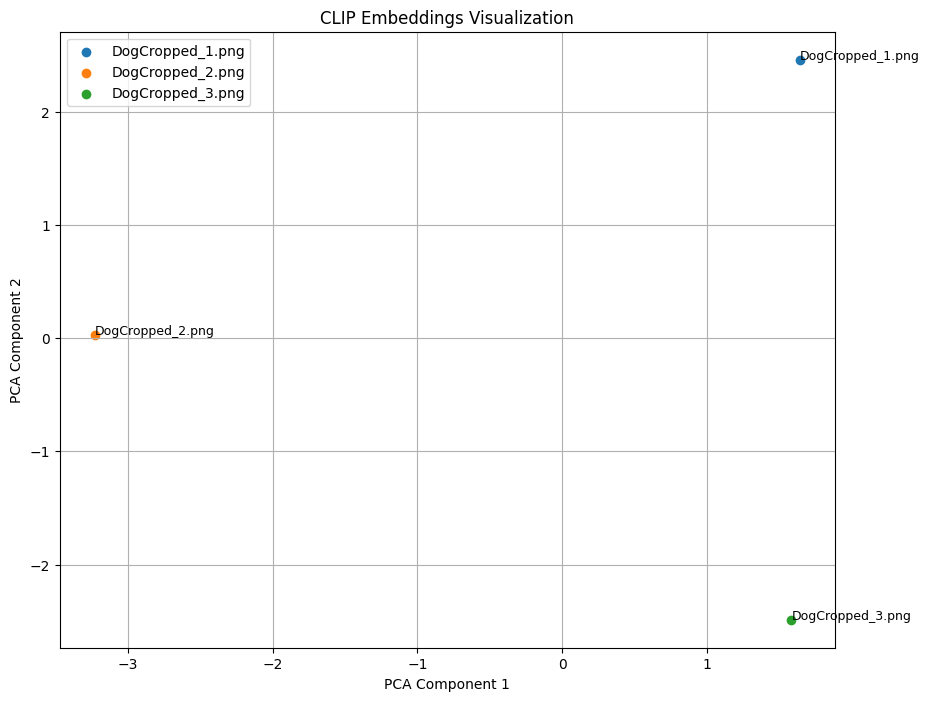

In [144]:
plot_clip_embeddings(embeddings)

In [145]:
# Example usage
image_paths = ["DogCropped_1_NB.png", "DogCropped_2_NB.png", "DogCropped_3_NB.png"]
# Get CLIP embeddings for the images
embeddings = get_clip_embeddings_for_images(image_paths)
# Compare CLIP embeddings of image pairs
similarities = compare_clip_embeddings(embeddings)

Cosine similarity between DogCropped_1_NB.png and DogCropped_2_NB.png: 0.9648
Cosine similarity between DogCropped_1_NB.png and DogCropped_3_NB.png: 0.9577
Cosine similarity between DogCropped_2_NB.png and DogCropped_3_NB.png: 0.9667


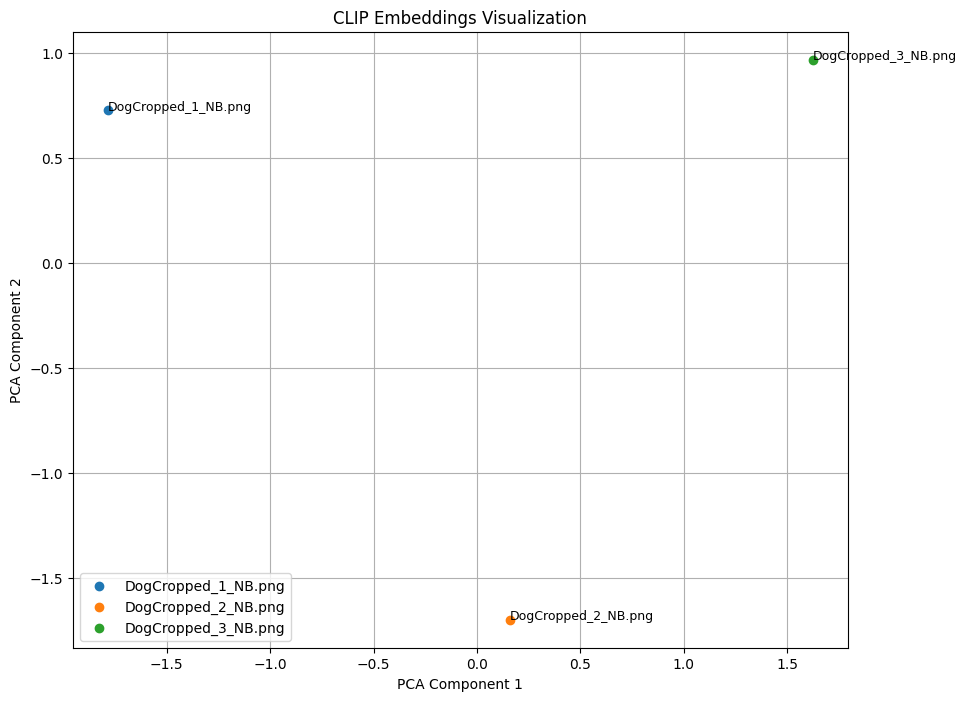

In [146]:
plot_clip_embeddings(embeddings)

In [6]:
# Example usage
image_paths = ["DogConsistent_1_NB.png", "DogConsistent_2_NB.png", "DogConsistent_3_NB.png", "dog_1_NB.png", "dog_2_NB.png", "dog_3_NB.png", "dog_4_NB.png", 
               "man_1_NB.png", "ball_1_NB.png", "cat_1_NB.png", "woman_1_NB.png"]
# Get CLIP embeddings for the images
embeddings = get_clip_embeddings_for_images(image_paths)
# Compare CLIP embeddings of image pairs
similarities = compare_clip_embeddings(embeddings)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Cosine similarity between DogConsistent_1_NB.png and DogConsistent_2_NB.png: 0.9648
Cosine similarity between DogConsistent_1_NB.png and DogConsistent_3_NB.png: 0.9577
Cosine similarity between DogConsistent_1_NB.png and dog_1_NB.png: 0.9035
Cosine similarity between DogConsistent_1_NB.png and dog_2_NB.png: 0.8525
Cosine similarity between DogConsistent_1_NB.png and dog_3_NB.png: 0.8366
Cosine similarity between DogConsistent_1_NB.png and dog_4_NB.png: 0.9083
Cosine similarity between DogConsistent_1_NB.png and man_1_NB.png: 0.4466
Cosine similarity between DogConsistent_1_NB.png and ball_1_NB.png: 0.6496
Cosine similarity between DogConsistent_1_NB.png and cat_1_NB.png: 0.7685
Cosine similarity between DogConsistent_1_NB.png and woman_1_NB.png: 0.6592
Cosine similarity between DogConsistent_2_NB.png and DogConsistent_3_NB.png: 0.9667
Cosine similarity between DogConsistent_2_NB.png and dog_1_NB.png: 0.8720
Cosine similarity between DogConsistent_2_NB.png and dog_2_NB.png: 0.8265
Cosin

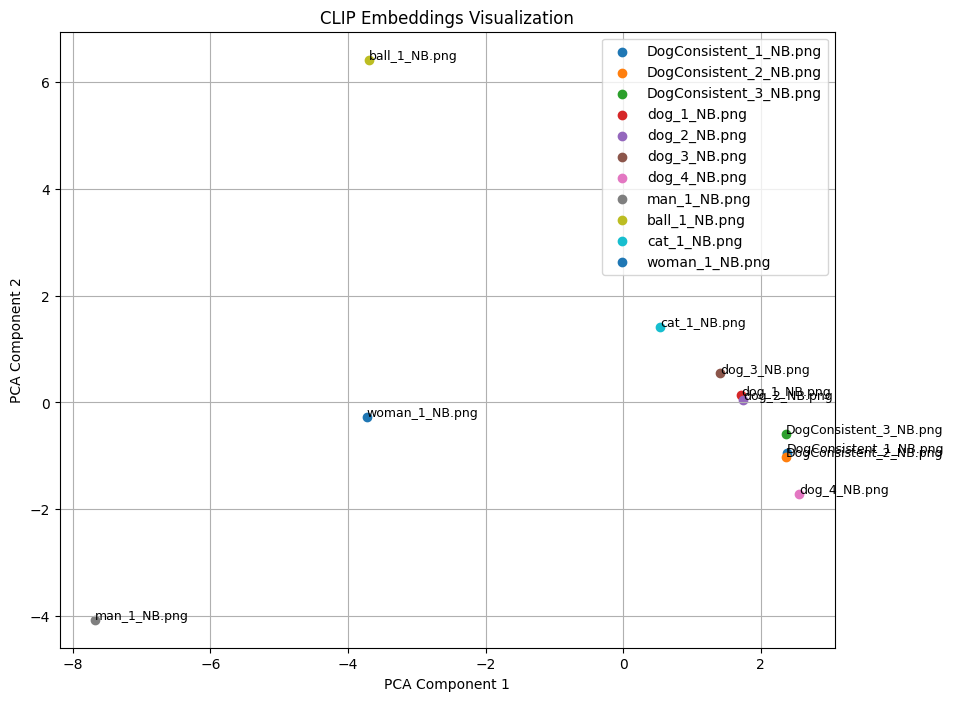

In [9]:
plot_clip_embeddings(embeddings)

In [159]:
# Example usage
image_paths = ["DogConsistent_1_NB.png", "DogConsistent_2_NB.png", "DogConsistent_3_NB.png", "dog_1_NB.png", "dog_2_NB.png", "dog_3_NB.png", "dog_4_NB.png"]
# Get CLIP embeddings for the images
embeddings = get_clip_embeddings_for_images(image_paths)
# Compare CLIP embeddings of image pairs
similarities = compare_clip_embeddings(embeddings)

Cosine similarity between DogConsistent_1_NB.png and DogConsistent_2_NB.png: 0.9648
Cosine similarity between DogConsistent_1_NB.png and DogConsistent_3_NB.png: 0.9577
Cosine similarity between DogConsistent_1_NB.png and dog_1_NB.png: 0.9035
Cosine similarity between DogConsistent_1_NB.png and dog_2_NB.png: 0.8525
Cosine similarity between DogConsistent_1_NB.png and dog_3_NB.png: 0.8366
Cosine similarity between DogConsistent_1_NB.png and dog_4_NB.png: 0.9083
Cosine similarity between DogConsistent_2_NB.png and DogConsistent_3_NB.png: 0.9667
Cosine similarity between DogConsistent_2_NB.png and dog_1_NB.png: 0.8720
Cosine similarity between DogConsistent_2_NB.png and dog_2_NB.png: 0.8265
Cosine similarity between DogConsistent_2_NB.png and dog_3_NB.png: 0.8192
Cosine similarity between DogConsistent_2_NB.png and dog_4_NB.png: 0.9089
Cosine similarity between DogConsistent_3_NB.png and dog_1_NB.png: 0.8896
Cosine similarity between DogConsistent_3_NB.png and dog_2_NB.png: 0.8460
Cosine s

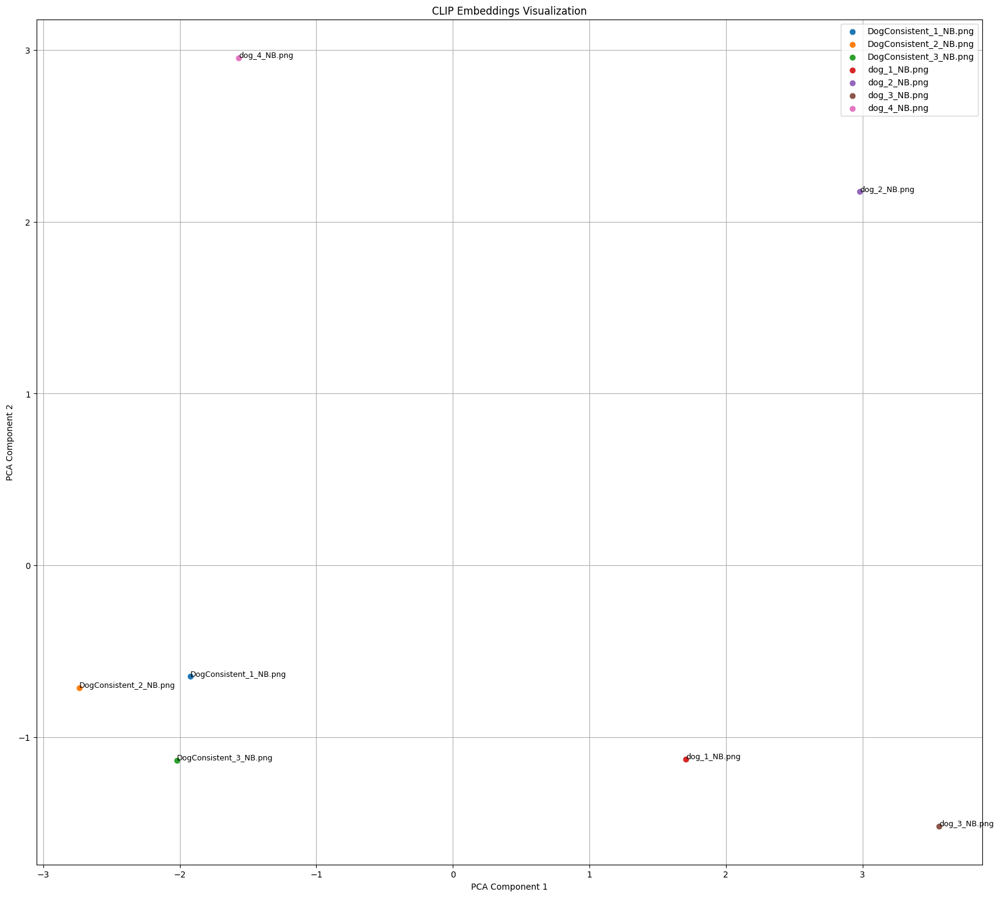

In [160]:
plot_clip_embeddings(embeddings)

# DINO Embeddings


In [1]:
import torch
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import numpy as np

# Load DINOv2 model and processor from Hugging Face
def load_dinov2_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    processor = AutoImageProcessor.from_pretrained("facebook/dino-vitb16")
    model = AutoModel.from_pretrained("facebook/dino-vitb16").to(device)
    model.eval()
    return model, processor, device

# Get single image embedding
def get_dinov2_embedding(image_path, model, processor, device):
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)
        embedding = outputs.last_hidden_state[:, 0, :]  # CLS token

    return embedding.squeeze(0).cpu().numpy()

# Get embeddings for list of images
def get_dinov2_embeddings_for_images(image_paths):
    model, processor, device = load_dinov2_model()
    embeddings = {}
    for path in image_paths:
        embedding = get_dinov2_embedding(path, model, processor, device)
        embeddings[path] = embedding
    return embeddings

# Compute cosine similarity between all image pairs
def compare_dinov2_embeddings(embeddings):
    similarities = {}
    paths = list(embeddings.keys())

    for i in range(len(paths)):
        for j in range(i + 1, len(paths)):
            emb1 = embeddings[paths[i]]
            emb2 = embeddings[paths[j]]
            sim = np.dot(emb1, emb2) / (np.linalg.norm(emb1) * np.linalg.norm(emb2))
            similarities[(paths[i], paths[j])] = sim
            print(f"Cosine similarity between {paths[i]} and {paths[j]}: {sim:.4f}")

    return similarities


c:\Users\zeina\Desktop\ImagesEvaluation\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# visualize DinoV2 embeddings
import matplotlib.pyplot as plt

def plot_dinov2_embeddings(embeddings):
    """Plot DINOv2 embeddings in 2D using PCA."""
    from sklearn.decomposition import PCA

    # Stack embeddings and apply PCA
    all_embeddings = np.vstack(list(embeddings.values()))
    pca = PCA(n_components=2)
    reduced_embeddings = pca.fit_transform(all_embeddings)

    # Plot the reduced embeddings
    plt.figure(figsize=(10, 8))
    for i, (path, emb) in enumerate(embeddings.items()):
        plt.scatter(reduced_embeddings[i, 0], reduced_embeddings[i, 1], label=os.path.basename(path))
        plt.annotate(os.path.basename(path), (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9)

    plt.title("DINOv2 Embeddings Visualization")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend()
    plt.grid(True)
    plt.show()

# remove legend
def remove_legend(ax):
    """Remove legend from the axes."""
    ax.get_legend().remove()    

In [12]:
def plot_dinov2_embeddings(embeddings):
    """Plot DINOv2 embeddings in 2D using PCA."""
    from sklearn.decomposition import PCA

    # Stack embeddings and apply PCA
    all_embeddings = np.vstack(list(embeddings.values()))
    pca = PCA(n_components=2)
    reduced_embeddings = pca.fit_transform(all_embeddings)

    # Plot the reduced embeddings
    plt.figure(figsize=(10, 8))
    for i, (path, emb) in enumerate(embeddings.items()):
        plt.scatter(reduced_embeddings[i, 0], reduced_embeddings[i, 1], label=os.path.basename(path))
        plt.annotate(os.path.basename(path), (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9)

    plt.title("DINOv2 Embeddings Visualization")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.grid(True)
    plt.show()

In [ ]:
image_paths = ["DogConsistent_1_NB.png", "DogConsistent_2_NB.png", "DogConsistent_3_NB.png"]
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)
plot_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between DogConsistent_1_NB.png and DogConsistent_2_NB.png: 0.9026
Cosine similarity between DogConsistent_1_NB.png and DogConsistent_3_NB.png: 0.8594
Cosine similarity between DogConsistent_2_NB.png and DogConsistent_3_NB.png: 0.8852


Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


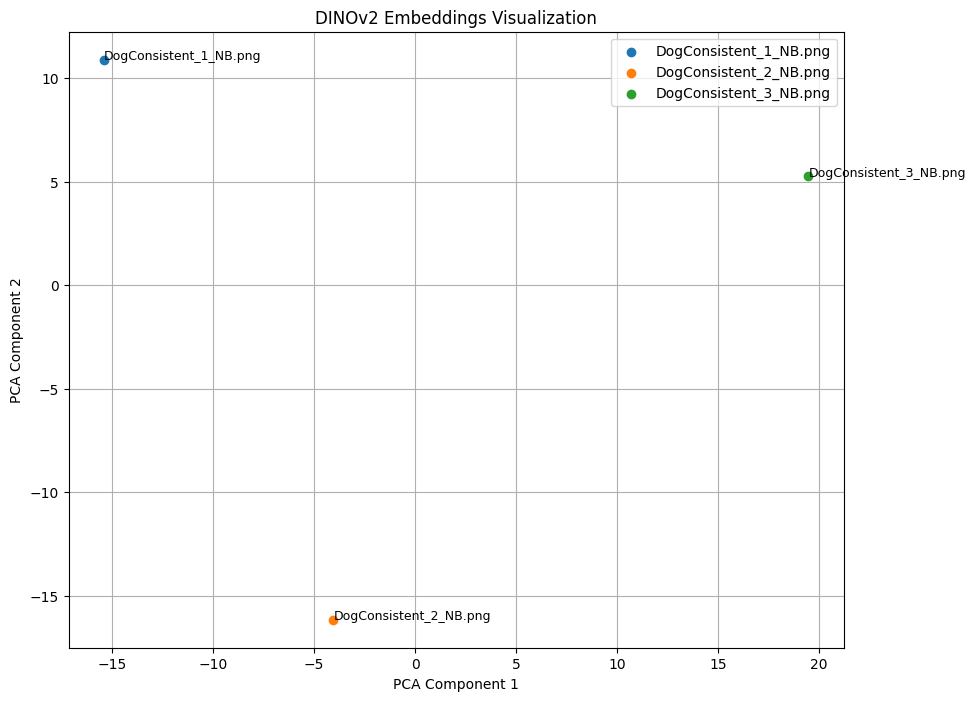

In [167]:
plot_dinov2_embeddings(embeddings)

In [168]:
image_paths = ["DogConsistent_1_NB.png", "DogConsistent_2_NB.png", "DogConsistent_3_NB.png", "dog_1_NB.png", "dog_2_NB.png", "dog_3_NB.png", "dog_4_NB.png"]
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)


Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between DogConsistent_1_NB.png and DogConsistent_2_NB.png: 0.9026
Cosine similarity between DogConsistent_1_NB.png and DogConsistent_3_NB.png: 0.8594
Cosine similarity between DogConsistent_1_NB.png and dog_1_NB.png: 0.5468
Cosine similarity between DogConsistent_1_NB.png and dog_2_NB.png: 0.3981
Cosine similarity between DogConsistent_1_NB.png and dog_3_NB.png: 0.3704
Cosine similarity between DogConsistent_1_NB.png and dog_4_NB.png: 0.7087
Cosine similarity between DogConsistent_2_NB.png and DogConsistent_3_NB.png: 0.8852
Cosine similarity between DogConsistent_2_NB.png and dog_1_NB.png: 0.4619
Cosine similarity between DogConsistent_2_NB.png and dog_2_NB.png: 0.3110
Cosine similarity between DogConsistent_2_NB.png and dog_3_NB.png: 0.2777
Cosine similarity between DogConsistent_2_NB.png and dog_4_NB.png: 0.6859
Cosine similarity between DogConsistent_3_NB.png and dog_1_NB.png: 0.4312
Cosine similarity between DogConsistent_3_NB.png and dog_2_NB.png: 0.2832
Cosine s

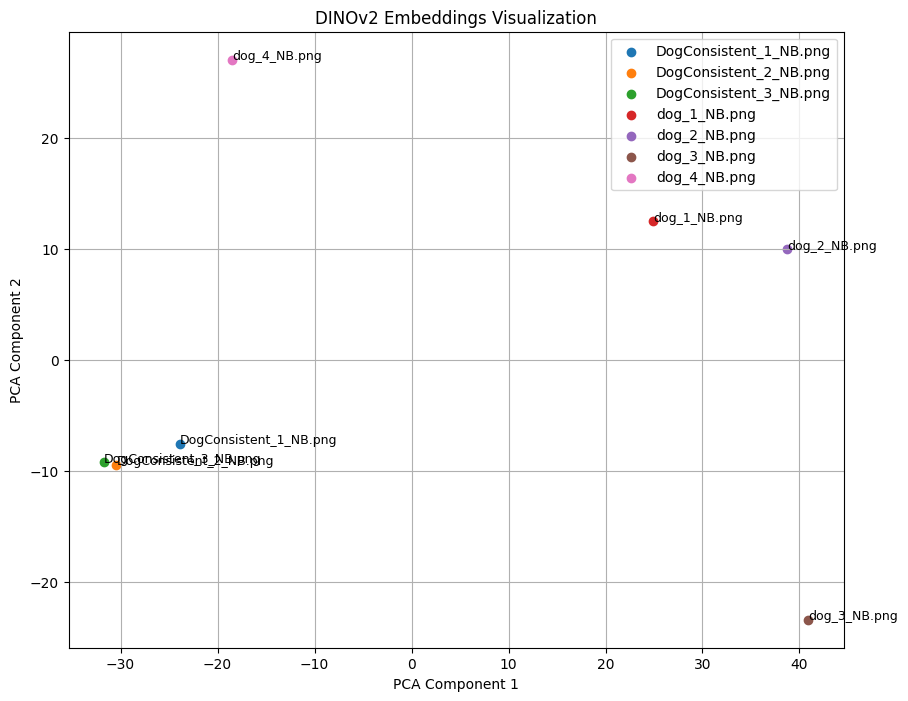

In [169]:
plot_dinov2_embeddings(embeddings)

In [170]:
image_paths = ["DogConsistent_1_NB.png", "DogConsistent_2_NB.png", "DogConsistent_3_NB.png", "dog_1_NB.png", "dog_2_NB.png", "dog_3_NB.png", "dog_4_NB.png", 
               "man_1_NB.png", "ball_1_NB.png", "cat_1_NB.png", "woman_1_NB.png"]
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between DogConsistent_1_NB.png and DogConsistent_2_NB.png: 0.9026
Cosine similarity between DogConsistent_1_NB.png and DogConsistent_3_NB.png: 0.8594
Cosine similarity between DogConsistent_1_NB.png and dog_1_NB.png: 0.5468
Cosine similarity between DogConsistent_1_NB.png and dog_2_NB.png: 0.3981
Cosine similarity between DogConsistent_1_NB.png and dog_3_NB.png: 0.3704
Cosine similarity between DogConsistent_1_NB.png and dog_4_NB.png: 0.7087
Cosine similarity between DogConsistent_1_NB.png and man_1_NB.png: 0.1978
Cosine similarity between DogConsistent_1_NB.png and ball_1_NB.png: 0.2053
Cosine similarity between DogConsistent_1_NB.png and cat_1_NB.png: 0.2863
Cosine similarity between DogConsistent_1_NB.png and woman_1_NB.png: 0.3532
Cosine similarity between DogConsistent_2_NB.png and DogConsistent_3_NB.png: 0.8852
Cosine similarity between DogConsistent_2_NB.png and dog_1_NB.png: 0.4619
Cosine similarity between DogConsistent_2_NB.png and dog_2_NB.png: 0.3110
Cosin

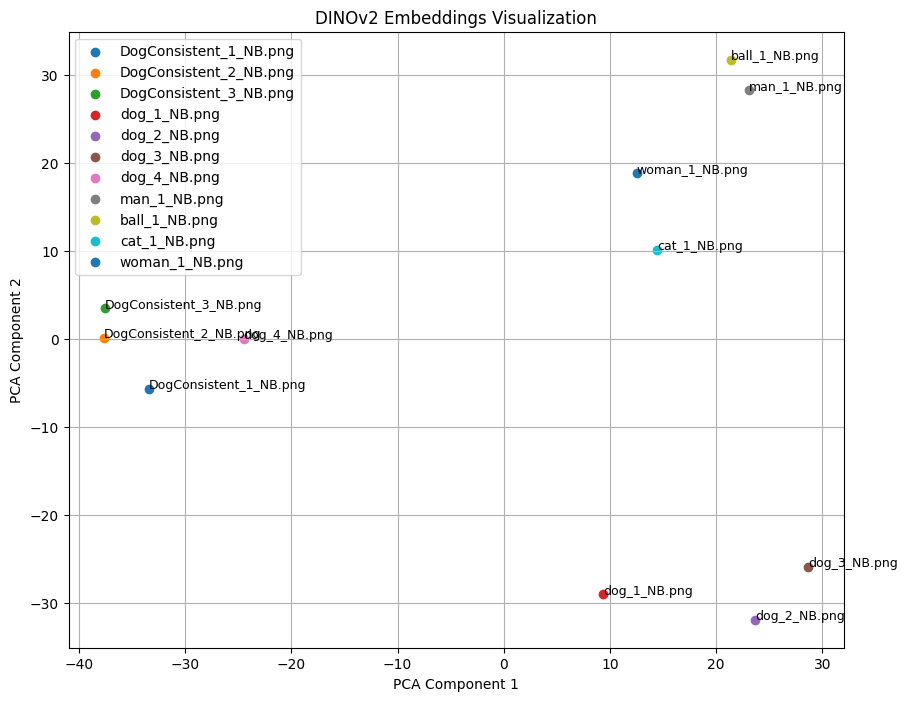

In [171]:
plot_dinov2_embeddings(embeddings)

In [20]:
image_paths = ["caseStudygirl_1.png", "caseStudygirl_2.png", "caseStudygirl_3.png", "caseStudywolf_1.png", "caseStudywolf_2.png", "caseStudywolf_3.png", "caseStudywolf_4.png", "caseStudywolf_5.png"]
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between caseStudygirl_1.png and caseStudygirl_2.png: 0.6564
Cosine similarity between caseStudygirl_1.png and caseStudygirl_3.png: 0.6183
Cosine similarity between caseStudygirl_1.png and caseStudywolf_1.png: 0.2740
Cosine similarity between caseStudygirl_1.png and caseStudywolf_2.png: 0.3495
Cosine similarity between caseStudygirl_1.png and caseStudywolf_3.png: 0.3060
Cosine similarity between caseStudygirl_1.png and caseStudywolf_4.png: 0.3929
Cosine similarity between caseStudygirl_1.png and caseStudywolf_5.png: 0.3009
Cosine similarity between caseStudygirl_2.png and caseStudygirl_3.png: 0.7430
Cosine similarity between caseStudygirl_2.png and caseStudywolf_1.png: 0.3630
Cosine similarity between caseStudygirl_2.png and caseStudywolf_2.png: 0.4376
Cosine similarity between caseStudygirl_2.png and caseStudywolf_3.png: 0.4045
Cosine similarity between caseStudygirl_2.png and caseStudywolf_4.png: 0.4330
Cosine similarity between caseStudygirl_2.png and caseStudywolf_

In [23]:
image_paths = [ "caseStudywolf_1.png", "caseStudywolf_2.png", "caseStudywolf_3.png", "caseStudywolf_4.png", "caseStudywolf_5.png"]
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between caseStudywolf_1.png and caseStudywolf_2.png: 0.6653
Cosine similarity between caseStudywolf_1.png and caseStudywolf_3.png: 0.6806
Cosine similarity between caseStudywolf_1.png and caseStudywolf_4.png: 0.6473
Cosine similarity between caseStudywolf_1.png and caseStudywolf_5.png: 0.7584
Cosine similarity between caseStudywolf_2.png and caseStudywolf_3.png: 0.7233
Cosine similarity between caseStudywolf_2.png and caseStudywolf_4.png: 0.8335
Cosine similarity between caseStudywolf_2.png and caseStudywolf_5.png: 0.7971
Cosine similarity between caseStudywolf_3.png and caseStudywolf_4.png: 0.7024
Cosine similarity between caseStudywolf_3.png and caseStudywolf_5.png: 0.7147
Cosine similarity between caseStudywolf_4.png and caseStudywolf_5.png: 0.7933


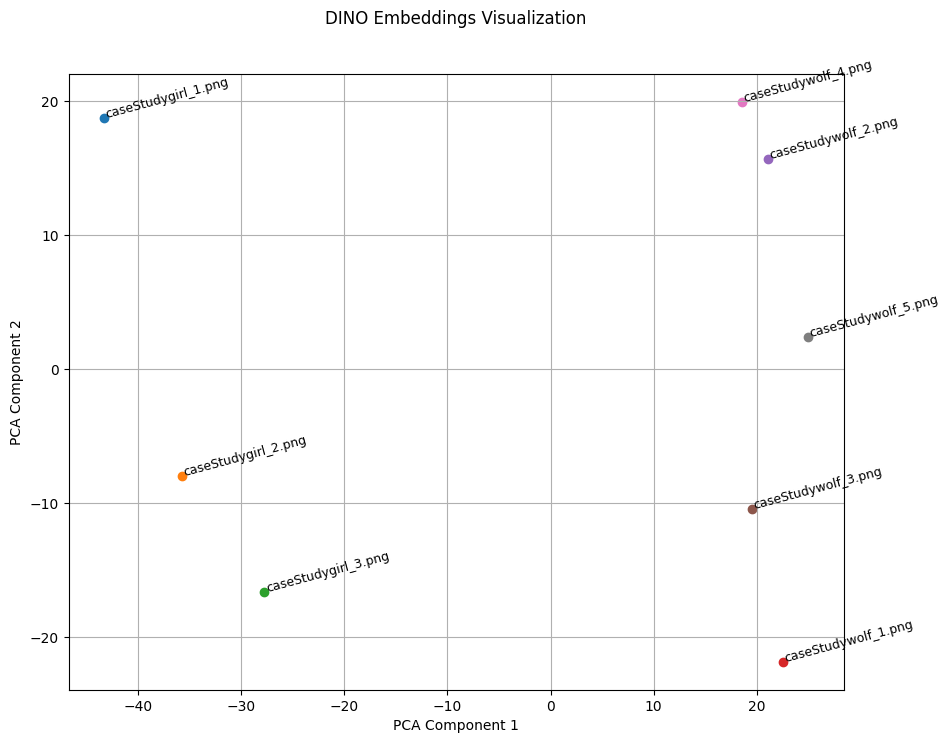

In [21]:
import os
plot_dinov2_embeddings(embeddings)

In [29]:
image_paths = ["RealBoy_1.png", "RealBoy_2.png", "RealBoy_3.png", "RealBoy_4.png"]
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between RealBoy_1.png and RealBoy_2.png: 0.6415
Cosine similarity between RealBoy_1.png and RealBoy_3.png: 0.5710
Cosine similarity between RealBoy_1.png and RealBoy_4.png: 0.8680
Cosine similarity between RealBoy_2.png and RealBoy_3.png: 0.4671
Cosine similarity between RealBoy_2.png and RealBoy_4.png: 0.6152
Cosine similarity between RealBoy_3.png and RealBoy_4.png: 0.4205


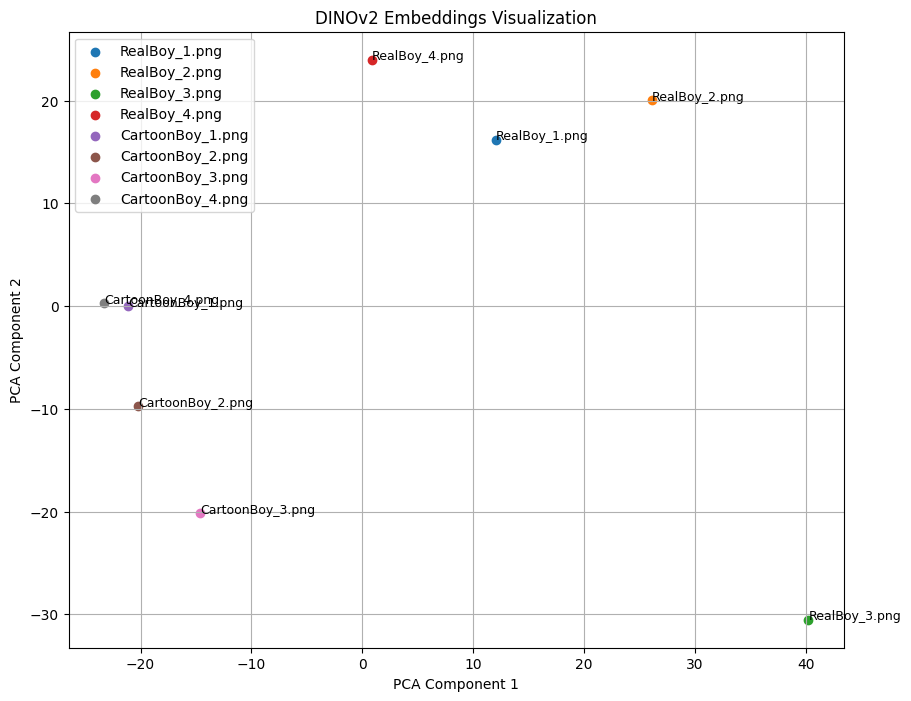

In [7]:
plot_dinov2_embeddings(embeddings)

In [27]:
image_paths = ["redRidingHood_1.png", "redRidingHood_2.png", "redRidingHood_3.png", "redRidingHood_4.png"] 
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between redRidingHood_1.png and redRidingHood_2.png: 0.6737
Cosine similarity between redRidingHood_1.png and redRidingHood_3.png: 0.6840
Cosine similarity between redRidingHood_1.png and redRidingHood_4.png: 0.6216
Cosine similarity between redRidingHood_2.png and redRidingHood_3.png: 0.8082
Cosine similarity between redRidingHood_2.png and redRidingHood_4.png: 0.6983
Cosine similarity between redRidingHood_3.png and redRidingHood_4.png: 0.7612


In [31]:
image_paths = ["customized wolf_1.png", "customized wolf_2.png", "customized wolf_3.png"] 
embeddings = get_dinov2_embeddings_for_images(image_paths)
similarities = compare_dinov2_embeddings(embeddings)

Some weights of ViTModel were not initialized from the model checkpoint at facebook/dino-vitb16 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Cosine similarity between customized wolf_1.png and customized wolf_2.png: 0.6293
Cosine similarity between customized wolf_1.png and customized wolf_3.png: 0.6965
Cosine similarity between customized wolf_2.png and customized wolf_3.png: 0.6058


In [18]:
def plot_dinov2_embeddings(embeddings):
    """Plot DINOv2 embeddings in 2D using PCA."""
    from sklearn.decomposition import PCA

    # Stack embeddings and apply PCA
    all_embeddings = np.vstack(list(embeddings.values()))
    pca = PCA(n_components=2)
    reduced_embeddings = pca.fit_transform(all_embeddings)

    # Plot the reduced embeddings
    plt.figure(figsize=(10, 8))
    for i, (path, emb) in enumerate(embeddings.items()):
        plt.scatter(reduced_embeddings[i, 0], reduced_embeddings[i, 1], label=os.path.basename(path))
        plt.annotate(os.path.basename(path), (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9, rotation=15)

    plt.title("DINO Embeddings Visualization\n\n")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.grid(True)
    plt.show()

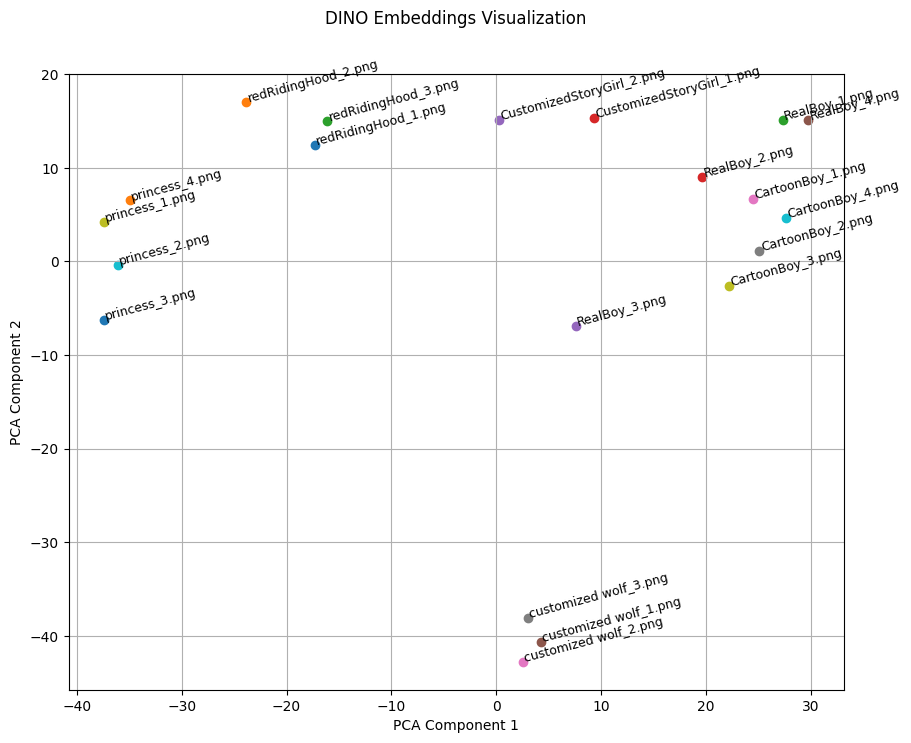

In [19]:
plot_dinov2_embeddings(embeddings)